In [2]:
setwd("/projects/CARDIPS/analysis/epigenome_resource")
source("analyses/jennifer/notebooks/functions.R")

set.seed(5366)

# **Identification of iPSCORE-specific eQTLs using mashr**

    My pipeline:
    
    1. Gather all lead gene-variants in GTEx and iPSCORE tissues
    2. Traverse each gene and get the beta and se values for those lead variants. 
       Meanwhile, go to step #5 to create mashr input for random 200k variants
    3. Select the "top" eQTL for each eGene based on maximum abs beta value
    4. Create mashr input for these "top" eQTLs and save as "strong" input
    
    5. Get all gene-variant pairs in iPSCORE
    6. Traverse each gene in iPSCORE and GTEx to get the beta and se values for those gene-variants
    7. Select gene-variant pairs that are tested in >50% of tissues
    8. Get beta and se values for these "random" gene-variants and make mashr input (saved as "random" input)
    
    9. Fit the model once all steps above are done. While model is fitting, run the next two steps to create inputs for the testing phase
    
    10. For each gene, create .txt files containing beta and se values for all lead variants in each iPSCORE and GTEx tissue
    11. Then, create mashr input .robj files 
    
    12. After model is done fitting and the mashr inputs are done generating (steps 10-11), run the model on each gene. 
        Note: mashr runs into an error if there's only one variant tested for that gene. We will rerun these genes in the next steps
    13. Aggregate all gene-variants for genes that were not tested into one mashr input, and rerun mashr again (takes ~20 min for 5,000 gene variants)
    
    
    


    

    Other example pipeline: https://github.com/stephenslab/mashr/issues/121:
   

## **load gtex tissues**

In [49]:
# gtex_tissues = c("Pancreas", "Artery_Aorta", "Artery_Coronary", "Heart_Atrial_Appendage", "Heart_Left_Ventricle")
gtex_tissues = fread("/reference/public/GTEX_v8/GTEx_v8_eQTL_Number_Samples.txt", data.table = F) 
#     filter(!tiss %in% c("Cells_Cultured_fibroblasts", "Cells_EBV-transformed_lymphocytes"))
head(gtex_tissues,2)

nrow(gtex_tissues)

,tiss,nsamples
,<chr>,<int>
1,Adipose_Subcutaneous,581
2,Adipose_Visceral_Omentum,469


[1] 49

## **separate gtex eqtls files**

In [78]:
for (tiss in gtex_tissues$tiss)
{
    pipeline = "/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/notebooks/separate_gtex_eqtls.sh"
    logout = paste(getwd(), "analyses/jennifer/logs", paste("separate", tiss, "out", sep = "."), sep = "/")
    logerr = paste(getwd(), "analyses/jennifer/logs", paste("separate", tiss, "err", sep = "."), sep = "/")
    outdir = paste(getwd(), "analyses/jennifer/gtex_egene_comparison/coloc", sep = "/")
    dir.create(outdir)
    cmd = paste("qsub", 
                "-N", tiss,
                "-V -cwd",
                "-o", logout, 
                "-e", logerr,
                "-pe smp 4",
                pipeline,
                tiss
               )

    message(cmd)
    system(cmd)
        
}

Warning message in dir.create(outdir):
“'/frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/gtex_egene_comparison/coloc' already exists”
qsub -N Brain_Amygdala -V -cwd -o /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/logs/separate.Brain_Amygdala.out -e /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/logs/separate.Brain_Amygdala.err -pe smp 4 /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/notebooks/separate_gtex_eqtls.sh Brain_Amygdala

Warning message in dir.create(outdir):
“'/frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/gtex_egene_comparison/coloc' already exists”
qsub -N Brain_Anterior_cingulate_cortex_BA24 -V -cwd -o /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/logs/separate.Brain_Anterior_cingulate_cortex_BA24.out -e /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/logs/separate.Brain_Anterior_cingulate_cortex_BA24

## **get gtex lead snps**

In [16]:
gtex_leads = as.data.frame(rbindlist(lapply(gtex_tissues$tiss, function(x)
{
    file = fread(paste("/reference/public/GTEX_v8/GTEx_Analysis_v8_eQTL", paste(x, "v8.egenes.txt.gz", sep = "."), sep = "/"), data.table = F) %>% filter(qval <= 0.05) %>% mutate(tissue = x)
})))

gtex_leads = gtex_leads %>% 
    mutate(chrpos = paste( gsub("chr", "", chr), variant_pos, sep = "_")) %>%
    mutate(chr = gsub("chr", "", chr)) %>%
    select(tissue, gene_id, slope, slope_se, chr, variant_pos, ref, alt, chrpos) %>% 
    dplyr::rename(pos = variant_pos, beta = slope, se = slope_se, element_id = gene_id) %>%
    filter(chr != "X") 
    

In [19]:
gtex_leads = gtex_leads %>% mutate(id = paste("VAR", chr, pos, ref, alt, sep = "_"))
gtex_leads = gtex_leads %>% 
    mutate(gene_variant1 = paste(simplify_id(element_id), paste("VAR", chr, pos, ref, alt, sep = "_")), 
           gene_variant2 = paste(simplify_id(element_id), paste("VAR", chr, pos, ref, alt, sep = "_")))


In [20]:
gtex_leads$nref = nchar(gtex_leads$ref)
gtex_leads$nalt = nchar(gtex_leads$alt)
gtex_leads$vartype = ifelse(gtex_leads$nref == 1 & gtex_leads$nalt == 1, "snp", "indel")

table(gtex_leads$vartype) / nrow(gtex_leads)


     indel        snp 
0.08139708 0.91860292 

In [21]:
fwrite(gtex_leads, "analyses/jennifer/ipscore_unique_qtls/mashr/input/gtex_lead_variants.txt", row.names = F, sep = "\t")

In [22]:
gtex_leads2 = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/gtex_lead_variants.txt", data.table = F) %>% filter(vartype == "snp")


In [24]:
gtex_leads2 %>% filter(gene_variant1 == "ENSG00000176697 VAR_11_28334110_C_T" & gene_variant2 == "ENSG00000176697 VAR_11_28334110_C_T")

tissue,element_id,beta,se,chr,pos,ref,alt,chrpos,id,gene_variant1,gene_variant2,nref,nalt,vartype
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>


In [26]:
gtex_leads2 %>% filter(gene_variant1 %like% "ENSG00000176697")

tissue,element_id,beta,se,chr,pos,ref,alt,chrpos,id,gene_variant1,gene_variant2,nref,nalt,vartype
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
Artery_Aorta,ENSG00000176697.18,0.137187,0.0307420,11,26734777,C,A,11_26734777,VAR_11_26734777_C_A,ENSG00000176697 VAR_11_26734777_C_A,ENSG00000176697 VAR_11_26734777_C_A,1,1,snp
Artery_Tibial,ENSG00000176697.18,0.134567,0.0332105,11,27984189,G,A,11_27984189,VAR_11_27984189_G_A,ENSG00000176697 VAR_11_27984189_G_A,ENSG00000176697 VAR_11_27984189_G_A,1,1,snp
Brain_Frontal_Cortex_BA9,ENSG00000176697.18,0.949164,0.2057680,11,27040064,C,T,11_27040064,VAR_11_27040064_C_T,ENSG00000176697 VAR_11_27040064_C_T,ENSG00000176697 VAR_11_27040064_C_T,1,1,snp
Cells_Cultured_fibroblasts,ENSG00000176697.18,0.234723,0.0367933,11,27934496,C,T,11_27934496,VAR_11_27934496_C_T,ENSG00000176697 VAR_11_27934496_C_T,ENSG00000176697 VAR_11_27934496_C_T,1,1,snp
Heart_Left_Ventricle,ENSG00000176697.18,-0.195847,0.0394983,11,27185627,A,G,11_27185627,VAR_11_27185627_A_G,ENSG00000176697 VAR_11_27185627_A_G,ENSG00000176697 VAR_11_27185627_A_G,1,1,snp
Small_Intestine_Terminal_Ileum,ENSG00000176697.18,-0.396235,0.0868852,11,27442285,A,G,11_27442285,VAR_11_27442285_A_G,ENSG00000176697 VAR_11_27442285_A_G,ENSG00000176697 VAR_11_27442285_A_G,1,1,snp


## **get ipscore lead snps**

In [60]:
qtls = fread("analyses/tim/ld_modules/scripts/primary_qtls.txt", data.table = F) %>% filter(datatype == "eqtls")

qtls$element_cond = ifelse(qtls$element_id %like% "ENSG",
                           paste(tolower(qtls$tissue), qtls$element_id, qtls$type, sep = "_"),
                           paste(qtls$element_id, qtls$type, sep = "_"))

head(qtls,2)

,element_id,id,chrom,pos,ref,alt,rsid,genotyped,af,beta,⋯,tests,type,new_egene,tissue,tissue_qtl_id,tissue_element,test,datatype,path,element_cond
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,⋯,<int>,<int>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ENSG00000000460.17,VAR_1_169804722_A_C,chr1,169804722,A,C,rs12142505,1,0.0805861,0.8196584,⋯,2248,0,TRUE,iPSC,iPSC_ENSG00000000460.17_0,iPSC_ENSG00000000460.17,original,eqtls,/projects/CARDIPS/analysis/epigenome_resource/eqtls/iPSC/step_4/qtl_by_element/qtl/qtl.ENSG00000000460.17.txt,ipsc_ENSG00000000460.17_0
2,ENSG00000000938.13,VAR_1_27564022_A_G,chr1,27564022,A,G,rs12146138,1,0.0567766,1.5833789,⋯,1037,0,TRUE,iPSC,iPSC_ENSG00000000938.13_0,iPSC_ENSG00000000938.13,original,eqtls,/projects/CARDIPS/analysis/epigenome_resource/eqtls/iPSC/step_4/qtl_by_element/qtl/qtl.ENSG00000000938.13.txt,ipsc_ENSG00000000938.13_0


In [23]:
# from /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/notebooks/REV.Lead_Variants.ipynb
ipscore_leads = fread("analyses/jennifer/summary_files/ipscore_downstream_lead_qtls.txt", data.table = F) %>%
    mutate(gene_variant1 = paste(simplify_id(element_id), id)) %>%
    mutate(gene_variant2 = paste(simplify_id(element_id), paste("VAR", gsub("chr", "", chrom), pos, alt, ref, sep = "_"))) %>%
    filter(datatype == "eqtls") %>%
    mutate(chr = gsub("chr", "", chrom)) %>%
    select(tissue, element_id, beta, se, chr, pos, ref, alt, element_cond) %>%
    mutate(chrpos = paste(chr, pos, sep = "_")) %>%
    mutate(gene_variant1 = paste(simplify_id(element_id), paste("VAR", chr, pos, ref, alt, sep = "_"))) %>%
    mutate(gene_variant2 = paste(simplify_id(element_id), paste("VAR", chr, pos, alt, ref, sep = "_")))

In [24]:
fwrite(ipscore_leads, "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_lead_variants.txt", row.names = F, sep = "\t")

In [18]:
ipscore_leads = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_lead_variants.txt", data.table = F)

### **write out lead variants**

In [61]:
m = merge(gtex_leads2 %>% mutate(element_id = simplify_id(element_id)) %>% filter(vartype != "indel"), 
          ipscore_leads %>% mutate(element_id = simplify_id(element_id)), all = T, by = c("chr", "pos", "element_id"))

tmp1 = m %>% filter(ref.x == ref.y & alt.x == alt.y)
tmp2 = m %>% filter(ref.x == alt.y & alt.x == ref.y)

# there are no conflicting alleles between gtex and ipscore
nrow(tmp2)

[1] 0

In [62]:
table(m$vartype)


   snp 
431001 

In [63]:
setdiff(colnames(gtex_leads2), colnames(ipscore_leads))

[1] "id"      "nref"    "nalt"    "vartype"

In [64]:
snps2test = rbind(gtex_leads2 %>% select(-nref, -nalt, -vartype, -id), ipscore_leads %>% select(-element_cond)) %>% 
    mutate(gene_id = simplify_id(element_id)) %>% 
    select(gene_id, chr, pos, ref, alt) %>% 
    distinct()

snps2test = snps2test %>% mutate(ipscore_snp1 = paste("VAR", chr, pos, ref, alt, sep = "_"), 
                                 ipscore_snp2 = paste("VAR", chr, pos, alt, ref, sep = "_"),
                                 gtex_snp1 = paste(paste0("chr", chr), pos, ref, alt, "b38", sep = "_"),
                                 gtex_snp2 = paste(paste0("chr", chr), pos, alt, ref, "b38", sep = "_"))

fwrite(snps2test, "analyses/jennifer/ipscore_unique_qtls/mashr/lead_snps_to_mashr.txt", row.names = F, sep = "\t")

In [65]:
head(snps2test,2)

,gene_id,chr,pos,ref,alt,ipscore_snp1,ipscore_snp2,gtex_snp1,gtex_snp2
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ENSG00000227232,1,64764,C,T,VAR_1_64764_C_T,VAR_1_64764_T_C,chr1_64764_C_T_b38,chr1_64764_T_C_b38
2,ENSG00000269981,1,108826,G,C,VAR_1_108826_G_C,VAR_1_108826_C_G,chr1_108826_G_C_b38,chr1_108826_C_G_b38


In [240]:
snps2test = fread("analyses/jennifer/ipscore_unique_qtls/mashr/lead_snps_to_mashr.txt", data.table = F)

### **write out top snps based on max beta**

In [67]:
a = gtex_leads2 %>% filter(vartype != "indel") %>% select(chr, pos, ref, alt, element_id, tissue, beta, se)  %>% mutate(element_id = simplify_id(element_id))
b = ipscore_leads %>% select(-element_cond) %>% select(chr, pos, ref, alt, element_id, tissue, beta, se) %>% mutate(element_id = simplify_id(element_id))
topsnps = rbind(a, b)
topsnps$element_id = simplify_id(topsnps$element_id)
topsnps$z = topsnps$beta / topsnps$se
topsnps = topsnps %>% dplyr::group_by(element_id) %>% dplyr::filter(abs(beta) == max(abs(beta)))

In [68]:
topsnps = topsnps %>% mutate(gene_variant = paste(element_id, paste("VAR", chr, pos, ref, alt, sep = "_")))

In [69]:
fwrite(topsnps, "analyses/jennifer/ipscore_unique_qtls/mashr/topsnps_to_mashr.txt", row.names = F, sep = "\t")

In [57]:
topsnps = fread("analyses/jennifer/ipscore_unique_qtls/mashr/topsnps_to_mashr.txt", data.table = F)

In [70]:
topsnps$nref = nchar(topsnps$ref)
topsnps$nalt = nchar(topsnps$alt)
topsnps$variant_type = ifelse(topsnps$nref > 1 | topsnps$nalt > 1, "indel", ifelse(topsnps$nref == 1 & topsnps$nalt == 1, "snp", "NA"))

table(topsnps$variant_type) / nrow(topsnps) * 100


snp 
100 

In [71]:
summary(abs(topsnps$z))
summary(abs(topsnps$beta))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.561   4.546   5.004   6.498   6.720  56.974 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0785  0.6490  0.9798  1.1238  1.4308 13.0938 

In [72]:
head(topsnps,2)

chr,pos,ref,alt,element_id,tissue,beta,se,z,gene_variant,nref,nalt,variant_type
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>
1,826965,A,G,ENSG00000189409,Adipose_Subcutaneous,0.470669,0.113611,4.142812,ENSG00000189409 VAR_1_826965_A_G,1,1,snp
1,6885612,A,T,ENSG00000270035,Adipose_Subcutaneous,0.923231,0.207966,4.439336,ENSG00000270035 VAR_1_6885612_A_T,1,1,snp


In [75]:
a = c(gtex_leads2[gtex_leads2$vartype != "indel",]$gene_variant1,
    gtex_leads2[gtex_leads2$vartype != "indel",]$gene_variant2, 
    ipscore_leads$gene_variant1,
    ipscore_leads$gene_variant2)

setdiff(topsnps$gene_variant, a)

character(0)

### **get ipscore summary stats for lead vars**

In [180]:
# traverse all summary data of CVPC eQTLs (already ran!)
# run in qlogin
Sys.time()
a = qtls[qtls$datatype == "eqtls",]
ipscore_all = as.data.frame(rbindlist(lapply(c(1:nrow(a)), function(row)
{
    fread(a[row,]$path, data.table = F) %>% 
        filter(type == a[row,]$type) %>%
        mutate(tissue = a[row,]$tissue)
})))

ipscore_all$element_cond = ifelse(ipscore_all$element_id %like% "ENSG",
                               paste(tolower(ipscore_all$tissue), ipscore_all$element_id, ipscore_all$type, sep = "_"),
                               paste(ipscore_all$element_id, ipscore_all$type, sep = "_"))

ipscore_all$gene_variant = paste(simplify_id(ipscore_all$element_id), ipscore_all$id)
ipscore_all$gtex_variant = paste(gsub("VAR_", "chr", ipscore_all$id), "b38", sep = "_")

fwrite(ipscore_all, "analyses/jennifer/summary_files/all_ipscore_eqtls.downstream.txt", row.names = F, sep = "\t")

Sys.time()

In [297]:
# run in qlogin
snps2test = fread("analyses/jennifer/ipscore_unique_qtls/mashr/lead_snps_to_mashr.txt", data.table = F)

ipscore_all = fread("analyses/jennifer/summary_files/all_ipscore_eqtls.downstream.txt", data.table = F)

ipscore_stats = ipscore_all %>% 
    filter(id %in% c(snps2test$ipscore_snp1, snps2test$ipscore_snp2)) %>%
    filter(simplify_id(element_id) %in% snps2test$gene_id) %>%
    mutate(gene_variant = paste(simplify_id(element_id), id))

ipscore_stats$gene_id = unlist(lapply(ipscore_stats$element_id, function(x) { simplify_id(x) }))

fwrite(ipscore_stats, "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_leadvars_stats_2024_0624.txt", row.names = F, sep = "\t")

In [ ]:
ipscore_stats = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_leadvars_stats_2024_0624.txt", data.table = F)

### **get gtex summary stats for lead vars (will take a long time, meanwhile generate input for random variants, see below)**

In [ ]:
# get statistics for lead variants in GTEx tissues
for (tissue in gtex_tissues$tiss)
{
    pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.get_qtl_stats.lead.sh", sep = "/")
    qtl_list = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/lead_snps_to_mashr.txt", sep = "/")
    logout = paste("analyses/jennifer/logs", paste("get_qtl_stats.lead", tissue, "out", sep = "."), sep = "/")
    logerr = paste("analyses/jennifer/logs", paste("get_qtl_stats.lead", tissue, "err", sep = "."), sep = "/")
    
    cmd = paste("qsub",
                "-N", tissue,
                "-V -cwd",
                "-o", logout,
                "-e", logerr,
                "-pe smp", 8,
                "-l h_vmem=8G",
                
                pipeline,
                tissue,
                qtl_list)
    
    message(cmd)
    system(cmd)
}

In [80]:
# run in qlogin
# while this is running, generate the set of random SNPs
gtex_stats = as.data.frame(rbindlist(lapply(gtex_tissues$tiss, function(tissue)
{
    message(tissue, appendLF = F)
    outfile = paste("analyses/jennifer/ipscore_unique_qtls/mashr/input", paste(tissue, "leadvars_2024_0624.txt", sep = "."), sep = "/")
    message(paste("Opening", outfile), appendLF = F)
    if (file.exists(outfile))
    {
       fread(outfile, data.table = F) %>% mutate(tissue = tissue) %>% mutate(element_id = simplify_id(gene_id))
    } else
    {
        message(paste(outfile, "missing!"))
    }
})))

fwrite(gtex_stats, "analyses/jennifer/ipscore_unique_qtls/mashr/input/gtex_leadvars_stats_2024_0624.txt", row.names = F, sep = "\t")

Adipose_Subcutaneous
Opening analyses/jennifer/ipscore_unique_qtls/mashr/input/Adipose_Subcutaneous.leadvars_2024_0624.txt


In [ ]:
# need to open on terminal with qlogin -pe smp 16 -l h_vmem=10G
gtex_stats = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/gtex_leadvars_stats_2024_0624.txt", data.table = F)

## **combine ipscore and gtex qtl stats**

In [ ]:
# Check that the alleles are the same in iPSCORE and GTEx
# Only use Adipose Subcutaneous (I just randomly selected this tissues) as a proxy for GTEx tissues
tmp1 = ipscore_stats %>% select(chrom, pos, ref, alt, element_id, id, beta, se) %>% mutate(element_id = simplify_id(element_id))
tmp2 = gtex_stats %>% filter(tissue == "Adipose_Subcutaneous") %>% 
    select(chr, pos, ref, alt, element_id,  slope, slope_se) 

m = merge(tmp1, tmp2, by = c("chrom", "pos", "element_id"))

tmp1 = m %>% filter(ref.x == ref.y & alt.x == alt.y)
tmp2 = m %>% filter(ref.x == alt.y & alt.x == ref.y)

nrow(tmp2)

In [ ]:
tmp1 = gtex_stats %>% select(gene_id, gene_variant1, slope, slope_se, pval_nominal, tissue) %>% 
    dplyr::rename(beta = slope, se = slope_se, pval = pval_nominal, gene_variant = gene_variant1)
tmp2 = ipscore_stats %>% select(gene_id, gene_variant, beta, se, pval, tissue) 

#length(intersect(tmp1$gene_variant, tmp2$gene_variant))

lead_stats = rbind(tmp1, tmp2) %>% 
    filter(gene_variant %in% c(ipscore_leads$gene_variant1, ipscore_leads$gene_variant2, 
                               gtex_leads2$gene_variant1, gtex_leads2$gene_variant2)) %>% 
    mutate(gene_variant_tiss = paste(gene_variant, tissue)) 

In [ ]:
# check if there are any duplicates
dup = lead_stats %>% filter(duplicated(gene_variant_tiss))
nrow(dup)

# I did this on the terminal - there are no duplicates

In [ ]:
length(unique(lead_stats$gene_id))

In [ ]:
conditions = unique(lead_stats$tissue)
writeLines(unique(conditions), "analyses/jennifer/ipscore_unique_qtls/mashr/input/conditions.txt", sep = "\n")

In [ ]:
# write out so we can separate by genes on qsub using 
# fwrite(lead_stats, "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_gtex_leadvars_stats_2024_0624.txt", row.names = F, sep = "\t")
fwrite(lead_stats, "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_gtex_leadvars_stats_2024_0710.txt", row.names = F, sep = "\t")


In [ ]:
writeLines(unique(lead_stats$gene_id), "analyses/jennifer/ipscore_unique_qtls/mashr/input/genes_to_test.txt", sep = "\n")

In [22]:
lead_stats = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_gtex_leadvars_stats_2024_0710.txt", data.table = F)

## **create mashr for training the model using the top snps ("strong")**

In [ ]:
# Make input for "strong" eQTLs for fitting the model
lead_stats2 = lead_stats %>% filter(gene_variant %in% topsnps$gene_variant)

Bhat = suppressMessages(reshape2::dcast(data = lead_stats2, gene_variant ~ tissue, value.var = "beta", fun.aggregate = mean))
Shat = suppressMessages(reshape2::dcast(data = lead_stats2, gene_variant ~ tissue, value.var = "se"  , fun.aggregate = mean))

Bhat[is.na(Bhat)] = 1e-6
Shat[is.na(Shat)] = 1

datalist = list("bhat" = Bhat, "shat" = Shat)
outfile = "analyses/jennifer/ipscore_unique_qtls/mashr/input/mash_input_strong_all_2024_0710.robj"
save(datalist, file = outfile)
message(paste("Saved:", outfile))

## **create mashr inputs for running the model on all lead vars**

In [88]:
# Make text input for each gene 
# This submits a single shell job reading each line one-by-one and writing them to their approp. gene file.
# Takes about 2 hours to traverse through 400,000,000 lines
# Faster than array job where you  need to read the input file of 400,000,000 lines, which takes a long time, 
# and then filter the df, which also takes a long time since it reads through the whole df
pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/separate_stats_by_gene.sh", sep = "/")
logout = paste("analyses/jennifer/logs", paste("separate_qtl_stats","out", sep = "."), sep = "/")
logerr = paste("analyses/jennifer/logs", paste("separate_qtl_stats","err", sep = "."), sep = "/")
input_file="/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_gtex_leadvars_stats_2024_0710.txt"
modelname = "all_2024_0710"

Sys.time()
cmd = paste("qsub",
            "-N", "separate",
            "-V -cwd",
            "-o", logout,
            "-e", logerr,
            "-pe smp", 8,
            "-l h_vmem=8G",
            "-l", paste0("hostname=\"", paste(paste0("fl-n-1-", c(1:16)), collapse = "|"), "\""),
            pipeline,
            input_file,
            modelname)

message(cmd)
system(cmd)

# Make mashr robj input for each gene
pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.make_input_per_gene.sh", sep = "/")
genelist = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/input/genes_to_test.txt", sep = "/")
ngenes   = length(readLines(genelist))
logout = paste("analyses/jennifer/logs", paste("make_input","out", sep = "."), sep = "/")
logerr = paste("analyses/jennifer/logs", paste("make_input","err", sep = "."), sep = "/")

Sys.time()
cmd = paste("qsub",
            "-N make_input",
            "-hold_jid", "separate",
            "-o", logout,
            "-e", logerr,
            "-pe smp 2",
            "-t", paste0("1-", ngenes, ":1"),
            "-tc 300",
#             "-l short",
            "-l", paste0("hostname=\"", paste(paste0("fl-n-1-", c(1:16)), collapse = "|"), "\""),
            pipeline,
            genelist,
            modelname)

message(cmd)
system(cmd)


qsub -N separate -V -cwd -o analyses/jennifer/logs/separate_qtl_stats.out -e analyses/jennifer/logs/separate_qtl_stats.err -pe smp 8 -l h_vmem=8G -l hostname="fl-n-1-1|fl-n-1-2|fl-n-1-3|fl-n-1-4|fl-n-1-5|fl-n-1-6|fl-n-1-7|fl-n-1-8|fl-n-1-9|fl-n-1-10|fl-n-1-11|fl-n-1-12|fl-n-1-13|fl-n-1-14|fl-n-1-15|fl-n-1-16" /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/separate_stats_by_gene.sh /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_gtex_leadvars_stats_2024_0710.txt



In [61]:
# check that we have inputs for each gene
genes = readLines(genelist)
missing = data.frame(gene = genes)
missing$filename = paste("analyses/jennifer/ipscore_unique_qtls/mashr/input", 
                         paste("by_gene", modelname, sep = "_"), 
                         paste(missing$gene, "robj", sep = "."), sep = "/")
missing$exists = file.exists(missing$filename)
table(missing$exists)


 TRUE 
33955 

# **Prepare "Random" dataset for model fitting**

    Goal: Select 200,000 SNPs tested across >50% of iPSCORE and GTEx tissues
    
    1. Get all gene variant pairs (and their summary stats) tested in iPSCORE
    2. Get summary stats for these variants in all 49 GTEx tissues
    3. Filter for gene-variants that were tested in all 3 iPSCORE + 49 GTEx tissues (54 total)
    4. Randomly select 200,000 gene-variant pairs

### **get all variant-gene pairs tested in iPSCORE (already ran! no need to rerun)**

In [ ]:
# run in qlogin (already ran!)
# only rerun if you have a different set of ipscore eqtls
ipscore_all = fread("analyses/jennifer/summary_files/all_ipscore_eqtls.downstream.txt", data.table = F)

out = ipscore_all %>% select(gtex_variant, element_id, gene_variant) %>% distinct()
out$gene_id = simplify_id(out$element_id)
fwrite(out, "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_variantpairs_list.txt", row.names = F, sep = "\t")

### **get summary data for those variant-gene pairs in GTEx tissues (already ran! no need to rerun)**

In [82]:
# get statistics for ipscore variants in GTEx tissues
for (tissue in gtex_tissues$tiss)
# for (tissue in c("Cells_Cultured_fibroblasts", "Cells_EBV-transformed_lymphocytes"))
{
    pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.get_qtl_stats.sh", sep = "/")
    qtl_list = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_variantpairs_list.txt", sep = "/")
    logout = paste("analyses/jennifer/logs", paste("get_qtl_stats", tissue, "out", sep = "."), sep = "/")
    logerr = paste("analyses/jennifer/logs", paste("get_qtl_stats", tissue, "err", sep = "."), sep = "/")
    
    cmd = paste("qsub",
                "-N", tissue,
                "-V -cwd",
                "-o", logout,
                "-e", logerr,
                "-pe smp", 12,
                "-l h_vmem=8G",
                 "-l", paste0("hostname=\"", paste(paste0("fl-n-1-", c(1:16)), collapse = "|"), "\""),
                pipeline,
                tissue,
                qtl_list)
    
    message(cmd)
    system(cmd)
}
    

qsub -N Cells_Cultured_fibroblasts -V -cwd -o analyses/jennifer/logs/get_qtl_stats.Cells_Cultured_fibroblasts.out -e analyses/jennifer/logs/get_qtl_stats.Cells_Cultured_fibroblasts.err -pe smp 12 -l h_vmem=8G -l short /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.get_qtl_stats.sh Cells_Cultured_fibroblasts /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/input/ipscore_variantpairs_list.txt

qsub -N Cells_EBV-transformed_lymphocytes -V -cwd -o analyses/jennifer/logs/get_qtl_stats.Cells_EBV-transformed_lymphocytes.out -e analyses/jennifer/logs/get_qtl_stats.Cells_EBV-transformed_lymphocytes.err -pe smp 12 -l h_vmem=8G -l short /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.get_qtl_stats.sh Cells_EBV-transformed_lymphocytes /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qt

### **annotate how many tissues were tested for each gene-variant**

In [ ]:
# annotate which gene-variant pairs are present in each GTEx tissue
for (tissue in gtex_tissues$tiss)
{
    message(tissue, appendLF = F)
    outfile = paste("analyses/jennifer/ipscore_unique_qtls/mashr/input", paste(tissue, "random_variants.txt", sep = "_"), sep = "/")
    if (file.exists(outfile))
    {
        if (!paste("in", tissue, sep = "_") %in% colnames(ipscore_all))
        {
            tmp = fread(outfile, data.table = F) 
            ipscore_all[,paste("in", tissue, sep = "_")] = ifelse(ipscore_all$gene_variant %in% tmp$gene_variant, T, F)
        } else
        {
            message(paste("Skipping", tissue))
        }
    } else
    {
        message(paste(outfile, "missing!"))
    } 
}

In [ ]:
# annotate which gene-variant pairs are present in each iPSCORE tissue
for (tiss in c("iPSC", "CVPC", "PPC"))
{
    message(tiss)
    ipscore_all[,paste("in", tiss, sep = "_")] = ifelse(ipscore_all$gene_variant %in% ipscore_all[ipscore_all$tissue == tiss,]$gene_variant, T, F)
}

In [ ]:
fwrite(ipscore_all, "analyses/jennifer/ipscore_unique_qtls/mashr/input/random_vars_which_tissue.txt", row.names = T, sep = "\t")

In [ ]:
ipscore_all = fread("analyses/jennifer/ipscore_unique_qtls/mashr/input/random_vars_which_tissue.txt", data.table = F)

### **get gene-variants that are tested in 50% of ipscore and gtex tissues**

In [65]:
52 * 0.5

[1] 26

In [ ]:
# I selected gene-variant pairs that were tested in at least 50% of the tissues (52 * 0.5 = ~26)
# This is because if we required that the gene-variant was tested in ALL 100% tissues, there would only be 1,576 genes left 
# But if we were to lower the threshold to require 50% of the tissues to be tested, 
# we would be able to train the mashr model on eQTLs for 10,727 genes of the total 12,125, which is more representative of the data

present_in_all = ipscore_all %>% 
    filter(ntissues >= 26) %>%
    select(gene_variant, id, gtex_variant, element_id) %>%
    distinct()

head(present_in_all,2)

message(paste("# genes:", length(unique(present_in_all$element_id))))
message(paste("# total genes:", length(unique(ipscore_all$element_id))))


In [756]:
fwrite(present_in_all, "analyses/jennifer/ipscore_unique_qtls/mashr/input/genevariants_in_all_tissues.txt", row.names = F, sep = "\t")

### **randomly select 200,000 eQTLs**

In [ ]:
rand_vars = sample(unique(present_in_all$gene_variant), 200000)

In [ ]:
writeLines(rand_vars, "analyses/jennifer/ipscore_unique_qtls/mashr/input/random_variants_200k.txt", sep = "\n")

In [171]:
rand_vars = readLines("analyses/jennifer/ipscore_unique_qtls/mashr/input/random_variants_200k.txt")

## **get qtl stats for the 200k random gene-variants in GTEx tissues**

In [ ]:
# get statistics for random variants for GTEx tissues
for (tissue in gtex_tissues$tiss)
{
    pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.get_qtl_stats_for_randvars.sh", sep = "/")
    qtl_list = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/input/random_variants_200k.txt", sep = "/")
    logout = paste("analyses/jennifer/logs", paste("get_qtl_stats_randvars", tissue, "out", sep = "."), sep = "/")
    logerr = paste("analyses/jennifer/logs", paste("get_qtl_stats_randvars", tissue, "err", sep = "."), sep = "/")
    
    cmd = paste("qsub",
                "-N", tissue,
                "-V -cwd",
                "-o", logout,
                "-e", logerr,
                "-pe smp", 8,
                "-l h_vmem=8G",
                "-l", paste0("hostname=\"", paste(paste0("fl-n-1-", c(1:16)), collapse = "|"), "\""),
                pipeline,
                tissue,
                qtl_list)
    
    message(cmd)
    system(cmd)
}
    

## **combine qtl stats from ipscore and gtex**

In [199]:
tmp1 = ipscore_all %>% filter(gene_variant %in% rand_vars) %>% select(gene_variant, beta, se, pval, tissue) 

tmp2 = as.data.frame(rbindlist(lapply(gtex_tissues$tiss, function(tissue)
{
    message(tissue, appendLF = F)
    outfile = paste("analyses/jennifer/ipscore_unique_qtls/mashr/input", paste(tissue, "random_variants_200k.txt", sep = "_"), sep = "/")
    tmp = fread(outfile, data.table = F) %>% select(-variant_id)
    return(tmp)
})))

stats_for_all = rbind(tmp1, tmp2)

Adipose_Subcutaneous
Adipose_Visceral_Omentum
Adrenal_Gland
Artery_Aorta
Artery_Coronary
Artery_Tibial
Brain_Amygdala
Brain_Anterior_cingulate_cortex_BA24
Brain_Caudate_basal_ganglia
Brain_Cerebellar_Hemisphere
Brain_Cerebellum
Brain_Cortex
Brain_Frontal_Cortex_BA9
Brain_Hippocampus
Brain_Hypothalamus
Brain_Nucleus_accumbens_basal_ganglia
Brain_Putamen_basal_ganglia
Brain_Spinal_cord_cervical_c-1
Brain_Substantia_nigra
Breast_Mammary_Tissue
Colon_Sigmoid
Colon_Transverse
Esophagus_Gastroesophageal_Junction
Esophagus_Mucosa
Esophagus_Muscularis
Heart_Atrial_Appendage
Heart_Left_Ventricle
Kidney_Cortex
Liver
Lung
Minor_Salivary_Gland
Muscle_Skeletal
Nerve_Tibial
Ovary
Pancreas
Pituitary
Prostate
Skin_Not_Sun_Exposed_Suprapubic
Skin_Sun_Exposed_Lower_leg
Small_Intestine_Terminal_Ileum
Spleen
Stomach
Testis
Thyroid
Uterus
Vagina
Whole_Blood


In [200]:
fwrite(stats_for_all, "analyses/jennifer/ipscore_unique_qtls/mashr/input/summary_stats_randvars_200k.txt", row.names = F, sep = "\t")

In [201]:
head(stats_for_all,2)

,gene_variant,beta,se,pval,tissue
,<chr>,<dbl>,<dbl>,<dbl>,<chr>
1,ENSG00000000460 VAR_1_168679157_G_A,-0.03755895,0.07165038,0.5983866,iPSC
2,ENSG00000000460 VAR_1_168752339_T_C,0.04023603,0.07314412,0.5821274,iPSC


## **prepare mashr input for random variants**

In [202]:
phat = reshape2::dcast(data = stats_for_all %>% filter(gene_variant %in% rand_vars), gene_variant ~ tissue, value.var = "pval")
shat = reshape2::dcast(data = stats_for_all %>% filter(gene_variant %in% rand_vars), gene_variant ~ tissue, value.var = "se"  )
bhat = reshape2::dcast(data = stats_for_all %>% filter(gene_variant %in% rand_vars), gene_variant ~ tissue, value.var = "beta")

In [208]:
datalist = list("phat" = phat, "bhat" = bhat, "shat" = shat, vars = rand_vars)
# save(datalist, file = "analyses/jennifer/ipscore_unique_qtls/mashr/input/mashr_input_random_all_2024_0624.robj")
save(datalist, file = "analyses/jennifer/ipscore_unique_qtls/mashr/input/mashr_input_random_all_2024_0710.robj")

# **fit mashr model (make sure mashr inputs for "strong" and "random" datasets are done)**

In [91]:
pipeline = "/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.mashr_fit.sh"
logout = paste("analyses/jennifer/logs", paste("fit_mashr","out", sep = "."), sep = "/")
logerr = paste("analyses/jennifer/logs", paste("fit_mashr","err", sep = "."), sep = "/")
modelname = "all_2024_0710"

cmd = paste("qsub",
            "-V -cwd", 
            "-N fit_mashr",
            "-o", logout,
            "-e", logerr,
            "-pe smp 16",
            "-l h_vmem=10G",
            pipeline,
            modelname)

message(cmd)
system(cmd)


qsub -V -cwd -N fit_mashr -o analyses/jennifer/logs/fit_mashr.out -e analyses/jennifer/logs/fit_mashr.err -pe smp 16 -l h_vmem=10G /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.mashr_fit.sh all_2024_0710



# **run mashr**

In [103]:
# launch array job to run mashr on each gene

pipeline = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.mashr_run.sh", sep = "/")
genelist = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/input/genes_to_test.txt", sep = "/")
modelname = "all_2024_0710"
logout = paste("analyses/jennifer/logs", paste("run_mashr","out", sep = "."), sep = "/")
logerr = paste("analyses/jennifer/logs", paste("run_mashr","err", sep = "."), sep = "/")

# model filename: /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/results/mashr_model_all.robj

cmd = paste("qsub",
            "-N run_mashr",
            "-hold_jid", "make_input",
            "-V -cwd",
            "-o", logout,
            "-e", logerr,
            "-pe smp 2",
            "-t", paste0("1-", ngenes, ":1"),
            "-tc 300",
#             "-l short",
            "-l", paste0("hostname=\"", paste(paste0("fl-n-1-", c(1:16)), collapse = "|"), "\""),
            pipeline,
            genelist,
            modelname)

message(cmd)
system(cmd)

qsub -N run_mashr -hold_jid make_input -V -cwd -o analyses/jennifer/logs/run_mashr.out -e analyses/jennifer/logs/run_mashr.err -pe smp 2 -t 1-33955:1 -tc 300 -l hostname="fl-n-1-1|fl-n-1-2|fl-n-1-3|fl-n-1-4|fl-n-1-5|fl-n-1-6|fl-n-1-7|fl-n-1-8|fl-n-1-9|fl-n-1-10|fl-n-1-11|fl-n-1-12|fl-n-1-13|fl-n-1-14|fl-n-1-15|fl-n-1-16" /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/run.mashr_run.sh /frazer01/projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/input/genes_to_test.txt all_2024_0710



## **Check output**

In [3]:
modelname = "all_2024_0710"
genelist = paste(getwd(), "analyses/jennifer/ipscore_unique_qtls/mashr/input/genes_to_test.txt", sep = "/")
genes = readLines(genelist)

In [4]:
dir = "analyses/jennifer/ipscore_unique_qtls/mashr"

In [5]:
files = list.files(paste(dir, "results", paste("by_gene", modelname, sep = "_"), sep = "/"), full.names = T)

In [ ]:
message(Sys.time())
results = lapply(genes, function(g)
{
    file = paste(dir, "results", paste("by_gene", modelname, sep = "_"), paste(g, "robj", sep = "."), sep = "/")
    if (file.exists(file))
    {
        load(file)
        out = outlist[["lfsr"]]
        out$gene_variant = rownames(out)
        if (ncol(out) == 53)
        {
            return(out)
        } else
        {
            message(file, "wrong number of columns")
        }
    } else
    {
        message(paste(file, "missing"), appendLF = F)
    }
})
message(Sys.time())

In [10]:
results2 = as.data.frame(rbindlist(results, use.names = T))


In [18]:
rownames(results2) = results2$gene_variant

In [ ]:
all_gene_variants = unique(c(ipscore_leads$gene_variant1, 
                               ipscore_leads$gene_variant2, 
                               gtex_leads2$gene_variant1, 
                               gtex_leads2$gene_variant2))

results2 = results2 %>% filter(gene_variant %in% all_gene_variants)

## **run mashr for missing lead variants**

In [23]:
# Run mashr for missing
missing = lead_stats %>% filter(!gene_variant %in% rownames(results2))

In [26]:
length(unique(lead_stats$gene_variant))

[1] 292953

In [29]:
length(unique(missing$gene_variant))

[1] 5701

In [31]:
# Convert to matrix
Bhat       = suppressMessages(reshape2::dcast(data = missing, gene_variant ~ tissue, value.var = "beta", fun.aggregate = mean))
Shat       = suppressMessages(reshape2::dcast(data = missing, gene_variant ~ tissue, value.var = "se"  , fun.aggregate = mean))

# Fill in missing
Bhat[is.na(Bhat)] = 1e-6
Shat[is.na(Shat)] = 1

# Count number of conditions
message(paste("Detected", ncol(Bhat), ncol(Shat), "conditions"))
message(paste("Detected", nrow(Bhat), nrow(Shat), "gene-variant pairs"))

# Write out
gene_id = "missing"
datalist = list("bhat" = Bhat, "shat" = Shat)
outfile = paste("analyses/jennifer/ipscore_unique_qtls/mashr/input", paste("by_gene", modelname, sep = "_"), paste(gene_id, "robj", sep = "."), sep = "/")
save(datalist, file = outfile)
message(paste("Saved:", outfile))    

# Run mashr (15min for 5000 pairs)
cmd = paste("export PATH=~/software/R-4.3.3/bin:$PATH; Rscript /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/mashr_run.R --testname missing --modelname", modelname)

message(cmd)
system(cmd)






Detected 53 53 conditions

Detected 5701 5701 gene-variant pairs

Saved: analyses/jennifer/ipscore_unique_qtls/mashr/input/by_gene_all_2024_0710/missing.robj

export PATH=~/software/R-4.3.3/bin:$PATH; Rscript /projects/CARDIPS/analysis/epigenome_resource/analyses/jennifer/ipscore_unique_qtls/mashr/scripts/mashr_run.R --testname missing --modelname all_2024_0710



In [36]:
g = "missing"
file = paste(dir, "results", paste("by_gene", modelname, sep = "_"), paste(g, "robj", sep = "."), sep = "/")
load(file, verbose = T)
out = outlist[["lfsr"]]
out$gene_variant = rownames(out)
results2 = rbind(results2, out)

Loading objects:
  outlist


In [38]:
# check that there are no duplicated gene variants
results2 %>% filter(duplicated(gene_variant))

Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


Adipose_Subcutaneous,Adipose_Visceral_Omentum,Adrenal_Gland,Artery_Aorta,Artery_Coronary,Artery_Tibial,Brain_Amygdala,Brain_Anterior_cingulate_cortex_BA24,Brain_Caudate_basal_ganglia,Brain_Cerebellar_Hemisphere,⋯,Stomach,Testis,Thyroid,Uterus,Vagina,Whole_Blood,iPSC,CVPC,PPC,gene_variant
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


In [40]:
# check that all lead variants were analyzed by mashr
lead_stats %>% filter(!gene_variant %in% rownames(results2))

gene_id,gene_variant,beta,se,pval,tissue,gene_variant_tiss
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


## **add info to mashr results**

In [43]:
a = lead_stats %>% select(gene_variant, tissue) %>% distinct()
ntissues_per_pair = data.frame(table(a$gene_variant))
colnames(ntissues_per_pair) = c("gene_variant", "ntissues_tested")

a = lead_stats %>% filter(tissue %in% c("iPSC", "CVPC", "PPC")) %>% select(gene_variant, tissue) %>% distinct()
nipscore_per_pair = data.frame(table(a$gene_variant))
colnames(nipscore_per_pair) = c("gene_variant", "nipscore_tested")

a = lead_stats %>% filter(!tissue %in% c("iPSC", "CVPC", "PPC")) %>% select(gene_variant, tissue) %>% distinct()
ngtex_per_pair = data.frame(table(a$gene_variant))
colnames(ngtex_per_pair) = c("gene_variant", "ngtex_tested")

ntissues_per_pair = merge(merge(ntissues_per_pair, nipscore_per_pair, by = "gene_variant", all = T), ngtex_per_pair, by = "gene_variant", all = T)
ntissues_per_pair[is.na(ntissues_per_pair)] = 0


In [44]:
# check that all pairs have ntissues per pair
results2 %>% filter(!gene_variant %in% ntissues_per_pair$gene_variant)

Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


Adipose_Subcutaneous,Adipose_Visceral_Omentum,Adrenal_Gland,Artery_Aorta,Artery_Coronary,Artery_Tibial,Brain_Amygdala,Brain_Anterior_cingulate_cortex_BA24,Brain_Caudate_basal_ganglia,Brain_Cerebellar_Hemisphere,⋯,Stomach,Testis,Thyroid,Uterus,Vagina,Whole_Blood,iPSC,CVPC,PPC,gene_variant
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>


In [50]:
lead_stats %>% filter(!tissue %in% gtex_tissues$tiss) %>% filter(!tissue %in% c("iPSC", "CVPC", "PPC"))

gene_id,gene_variant,beta,se,pval,tissue,gene_variant_tiss
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


In [51]:
summary(ntissues_per_pair$ngtex_tested)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00   47.00   49.00   43.83   49.00   49.00 

In [52]:
results3 = merge(results2, ntissues_per_pair, by = "gene_variant", all.x = T) %>% 
    dplyr::relocate(ngtex_tested   , .after = gene_variant) %>%
    dplyr::relocate(nipscore_tested, .after = gene_variant) %>%
    dplyr::relocate(ntissues_tested, .after = gene_variant)



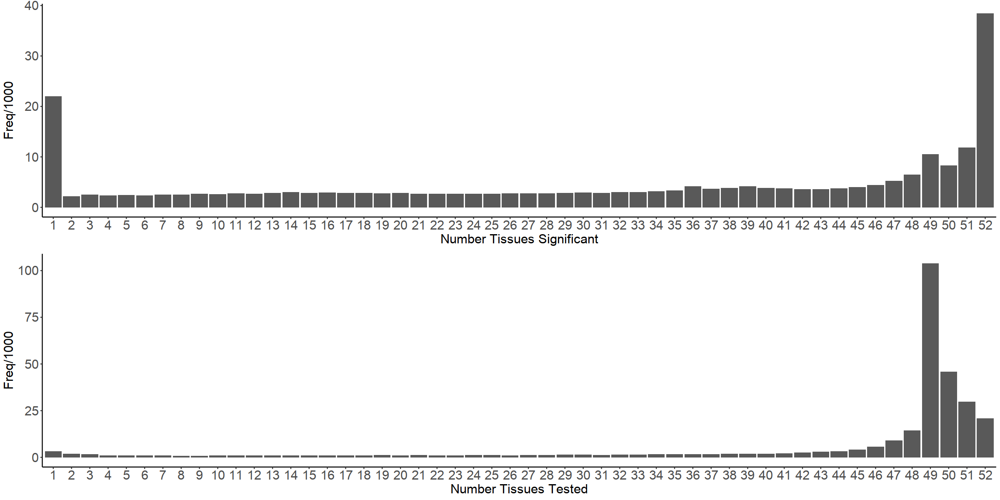

In [53]:
# annotate how many tissues have significant activity
lfsr_threshold = 0.05

a = results3 %>% select(-gene_variant, -ntissues_tested, -nipscore_tested, -ngtex_tested)
log_mat = a < lfsr_threshold
results3$ntissues_significant = apply(log_mat, 1, function(row) {sum(row, na.rm = TRUE)})
results3 = results3 %>% dplyr::relocate(ntissues_significant, .after = ntissues_tested)

psize(w = 20, h = 10)
p1 = ggplot(data.frame(table(results3$ntissues_significant)) %>% filter(Var1 != 0), aes(x = Var1, y = Freq/1e3)) + 
    geom_bar(stat = "identity") + jn_classic + xlab("Number Tissues Significant")

p2 = ggplot(data.frame(table(results3$ntissues_tested)), aes(x = Var1, y = Freq/1e3)) + 
    geom_bar(stat = "identity") + jn_classic + xlab("Number Tissues Tested")

plot_grid(p1, p2, align = "hv", ncol = 1)

In [350]:
lead_stats %>% filter(!gene_variant %in% results3$gene_variant)

gene_id,gene_variant,beta,se,pval,tissue,gene_variant_tiss
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


In [54]:
results3 = results3 %>% 
    dplyr::relocate(PPC , .after = ngtex_tested) %>%
    dplyr::relocate(CVPC, .after = ngtex_tested) %>%
    dplyr::relocate(iPSC, .after = ngtex_tested)

## **write out mashr results**

In [55]:
# fwrite(results3, "analyses/jennifer/ipscore_unique_qtls/mashr/results/mashr_results_all_leads.txt", row.names = F, sep = "\t")

fwrite(results3, "analyses/jennifer/ipscore_unique_qtls/mashr/results/mashr_results_all_leads_2024_0710.txt", row.names = F, sep = "\t")


In [29]:
results2 = fread("analyses/jennifer/ipscore_unique_qtls/mashr/results/mashr_results_all_leads.txt", data.table = F)
# results3 = fread("analyses/jennifer/ipscore_unique_qtls/mashr/results/mashr_results_all_leads_2024_0710.txt", data.table = F)

In [8]:
geneinfo = fread("/reference/private/Gencode.v44lift38/gene_info.txt")

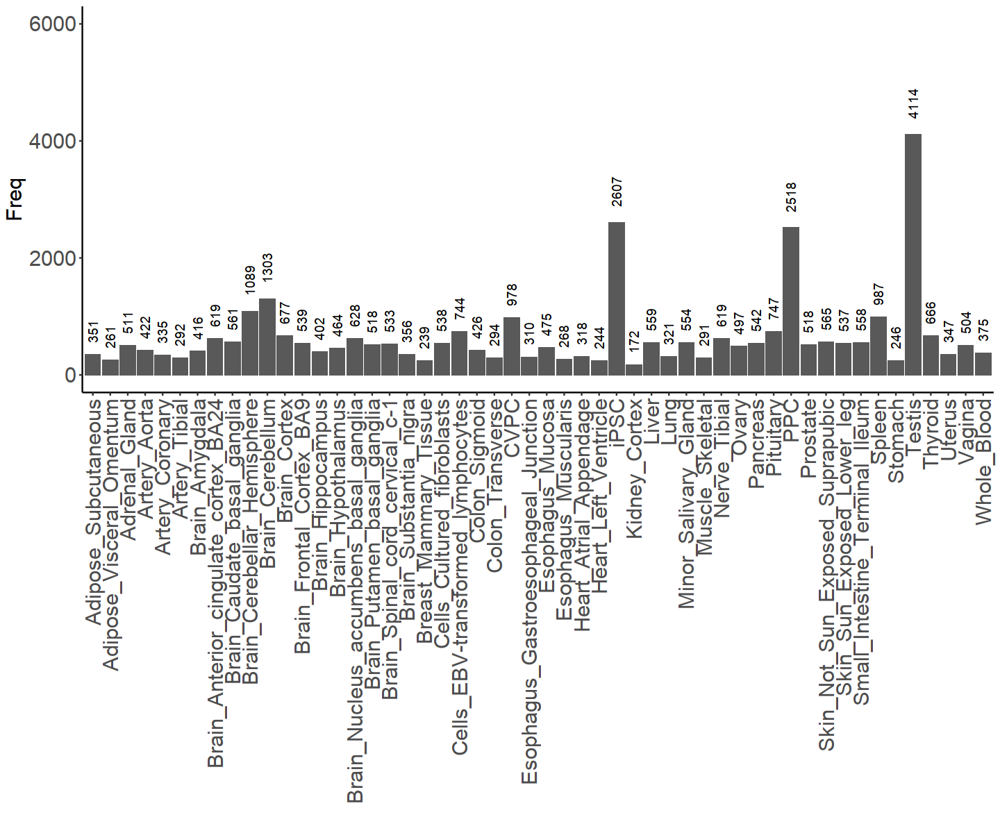

In [58]:
psize(w = 12, h = 10)
ggplot(data.frame(table(topsnps$tissue)) , aes(x = Var1, y = Freq, label = Freq)) + 
    geom_bar(stat = "identity") + 
    jn_classic + 
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1)) + 
    xlab("") + ylim(0, 6000) +
    geom_text(hjust = -0.5, angle = 90)
    

## **correlation of effect sizes of iPSCORE lead variants**

[1] 18034

Warning message in dcast(data = filt, gene_variant ~ tissue, value.var = "beta"):
“The dcast generic in data.table has been passed a data.frame and will attempt to redirect to the reshape2::dcast; please note that reshape2 is deprecated, and this redirection is now deprecated as well. Please do this redirection yourself like reshape2::dcast(filt). In the next version, this warning will become an error.”


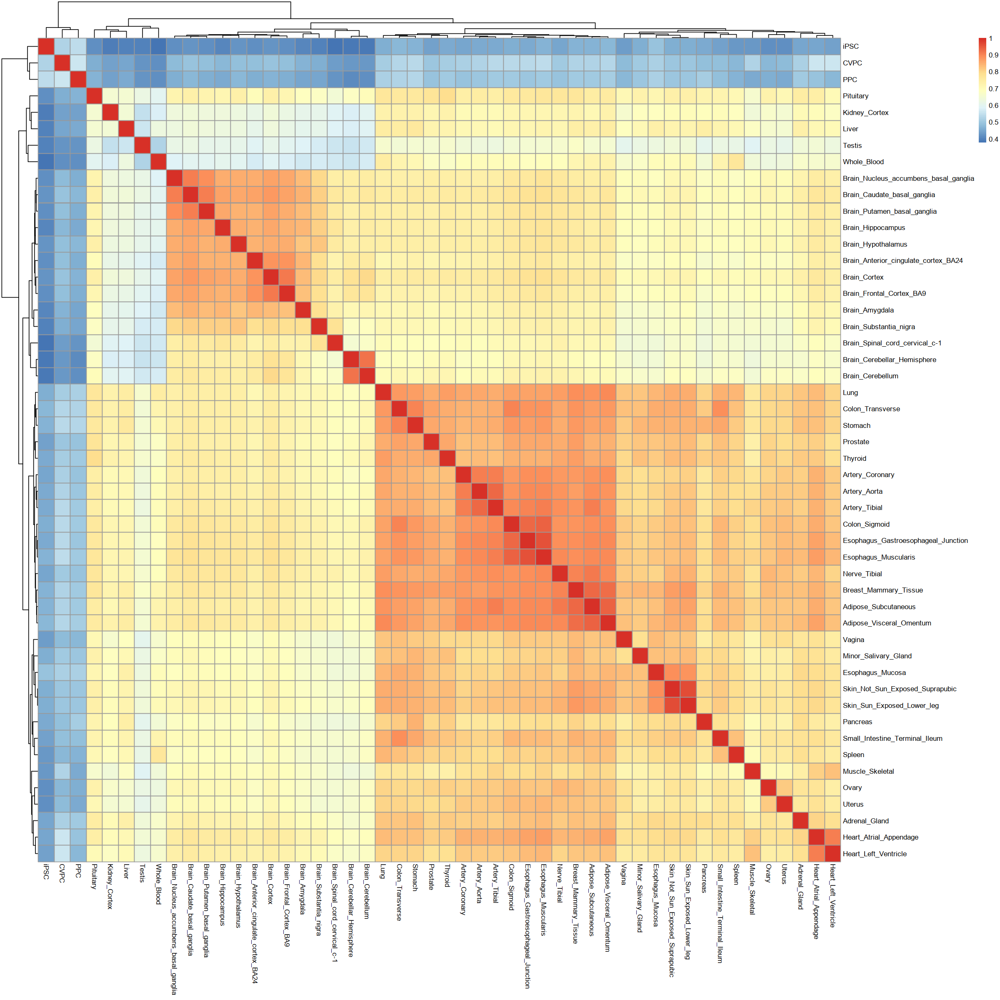

In [143]:
filt = lead_stats %>% filter(gene_variant %in% c(gtex_stats$gene_variant1, ipscore_leads$gene_variant1)) %>% filter(gene_variant %in% c(ipscore_leads$gene_variant1, ipscore_leads$gene_variant2))
length(unique(filt$gene_variant))
dbeta = dcast(data = filt, gene_variant ~ tissue, value.var = "beta")
dbeta = add_rownames(dbeta)
dbeta[is.na(dbeta)] = 0

pheatmap::pheatmap(as.matrix(cor(dbeta)))

## **correlation of effect sizes of GTEx lead variants **

[1] 42495

Warning message in dcast(data = filt, gene_variant ~ tissue, value.var = "beta"):
“The dcast generic in data.table has been passed a data.frame and will attempt to redirect to the reshape2::dcast; please note that reshape2 is deprecated, and this redirection is now deprecated as well. Please do this redirection yourself like reshape2::dcast(filt). In the next version, this warning will become an error.”


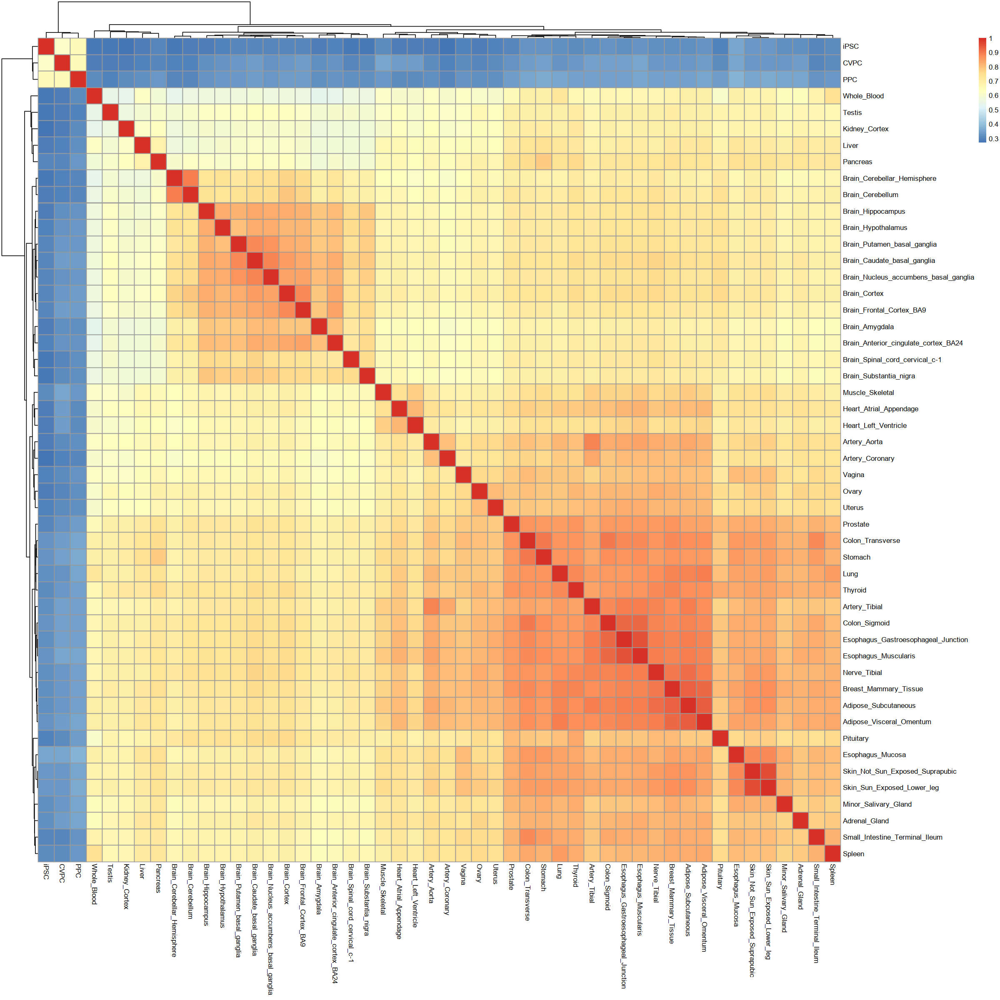

In [144]:
filt = lead_stats %>% filter(gene_variant %in% c(gtex_stats$gene_variant1, ipscore_leads$gene_variant1)) %>% filter(gene_variant %in% c(gtex_leads$gene_variant1, gtex_leads$gene_variant2))
length(unique(filt$gene_variant))
dbeta = dcast(data = filt, gene_variant ~ tissue, value.var = "beta")
dbeta = add_rownames(dbeta)
dbeta[is.na(dbeta)] = 0

pheatmap::pheatmap(as.matrix(cor(dbeta)))

## **plot mashr results**

In [ ]:
plot_manhattan = function(gene_variant, results)
{
    
    geneinfo = fread("/reference/private/Gencode.v44lift38/gene_info.txt")
    
    geneid = unlist(strsplit(gene_variant, " "))[1]
    variant = unlist(strsplit(gene_variant, " "))[2]
    toplot = as.data.frame(rbindlist(lapply(colnames(results), function(tiss)
    {
        if (!tiss %in% c("gene_variant", "gene_id", "variant", "ntissues"))
        {
            message(tiss, appendLF = F)
            if (tiss %in% c("CVPC", "PPC", "iPSC"))
            {
                
                file = qtls[qtls$tissue == tiss & qtls$element_id %like% geneid,]$path
                if (nrow(qtls[qtls$tissue == tiss & qtls$element_id %like% geneid,]) > 0)
                {
                    if (file.exists(file))
                    {
                        qtltype = qtls[qtls$tissue == tiss & qtls$element_cond %like% geneid,]$type
                        fread(file, data.table = F) %>% 
                            filter(type == qtltype) %>% 
                            mutate(gene_id = simplify_id(element_id)) %>%
                            select(gene_id, pos, pval) %>%
                            mutate(tissue = tiss)
                    } else
                    {
                        message(paste(file, "does not exist"), appendLF = F)
                    }
                } else
                {
                    file = paste("eqtls", tiss, "step_4/qtl_by_element/qtl", paste("qtl", geneinfo[geneinfo$gene_id %like% geneid,]$gene_id, "txt", sep = "."), sep = "/")
                    if (file.exists(file))
                    {
                        qtltype = qtls[qtls$tissue == tiss & qtls$element_cond %like% geneid,]$type
                        fread(file, data.table = F) %>% 
                            filter(type == 0) %>% 
                            mutate(gene_id = simplify_id(element_id)) %>%
                            select(gene_id, pos, pval) %>%
                            mutate(tissue = tiss)
                    } else
                    {
                        message(paste(file, "does not exist"), appendLF = F)
                    }
                }
                    
            } else
            {
                file = paste("analyses/jennifer/gtex_egene_comparison/coloc", tiss, paste("qtl", geneid, "txt", sep = "."), sep = "/")
                if (file.exists(file))
                {
                    fread(file, data.table = F) %>%
                        mutate(pos = as.numeric(unlist(lapply(variant_id, function(x) { unlist(strsplit(x, "_"))[2] })))) %>%
                        select(gene_id, pos, pval_nominal) %>%
                        dplyr::rename(pval = pval_nominal) %>%
                        mutate(gene_id = simplify_id(gene_id)) %>%
                        mutate(tissue = tiss)
                } else
                {
                    message(paste(file, "does not exist"), appendLF = F)
                }

            }
        }
    })))
    
    toplot$tissue = factor(toplot$tissue, levels = c("iPSC", "CVPC", "PPC", unique(toplot$tissue)[which(!unique(toplot$tissue) %in% c("iPSC", "CVPC", "PPC"))]))
    
    psize(w = 20, h = 20)
    p = ggplot(toplot, aes(x = pos / 1e6, y = -log10(pval))) + geom_point() + jn_classic + 
        facet_wrap(.~tissue) + 
        theme(strip.text = element_text(size = 17)) + 
        geom_hline(yintercept = -log10(5e-5), color = "red", linetype = "dashed") + 
        geom_point(data = toplot %>% filter(pos == unlist(strsplit(variant, "_"))[3] ), color = "red", size = 4) + 
        xlab("Position (Mb)") + ggtitle(gene_variant)

    return(p) 
}
    


In [98]:
geneinfo = fread("/reference/private/Gencode.v44lift38/gene_info.txt")

tmp = mashr_results %>% select(-gene_id, -variant_id, -ipscore_expressed, -ipscore_variant_tested, -ntissues_tested, -ntissues_significant, -nipscore_tested, -ngtex_tested, -gene_variant)
# p = suppressMessages(plot_manhattan("ENSG00000031698 VAR_1_109229079_A_C", results))
# p = suppressMessages(plot_manhattan("ENSG00000035687 VAR_1_244353652_T_C", results))
# p = suppressMessages(plot_manhattan("ENSG00000054282 VAR_1_243705096_T_C", results))
# p = suppressMessages(plot_manhattan("ENSG00000223764 VAR_1_1074443_G_A", results))
# p = suppressMessages(plot_manhattan("ENSG00000130939 VAR_1_9098883_G_A", results))
# p = suppressMessages(plot_manhattan("ENSG00000177600 VAR_11_1680940_A_G", results))
# p = suppressMessages(plot_manhattan("ENSG00000163283 VAR_2_232402285_G_A", tmp))
# p = suppressMessages(plot_manhattan("ENSG00000134717 VAR_1_52003284_A_G", tmp))
# p = suppressMessages(plot_manhattan("ENSG00000134717 VAR_1_52372950_G_A", tmp))
# p = suppressMessages(plot_manhattan("ENSG00000163283 VAR_2_232370195_G_T", tmp))
# p = suppressMessages(plot_manhattan("ENSG00000132703 VAR_1_158989981_G_A", tmp))
# p = suppressMessages(plot_manhattan("ENSG00000104915 VAR_19_13500292_A_G", tmp))
p = suppressMessages(plot_manhattan("ENSG00000104915 VAR_19_13149350_T_G", tmp))

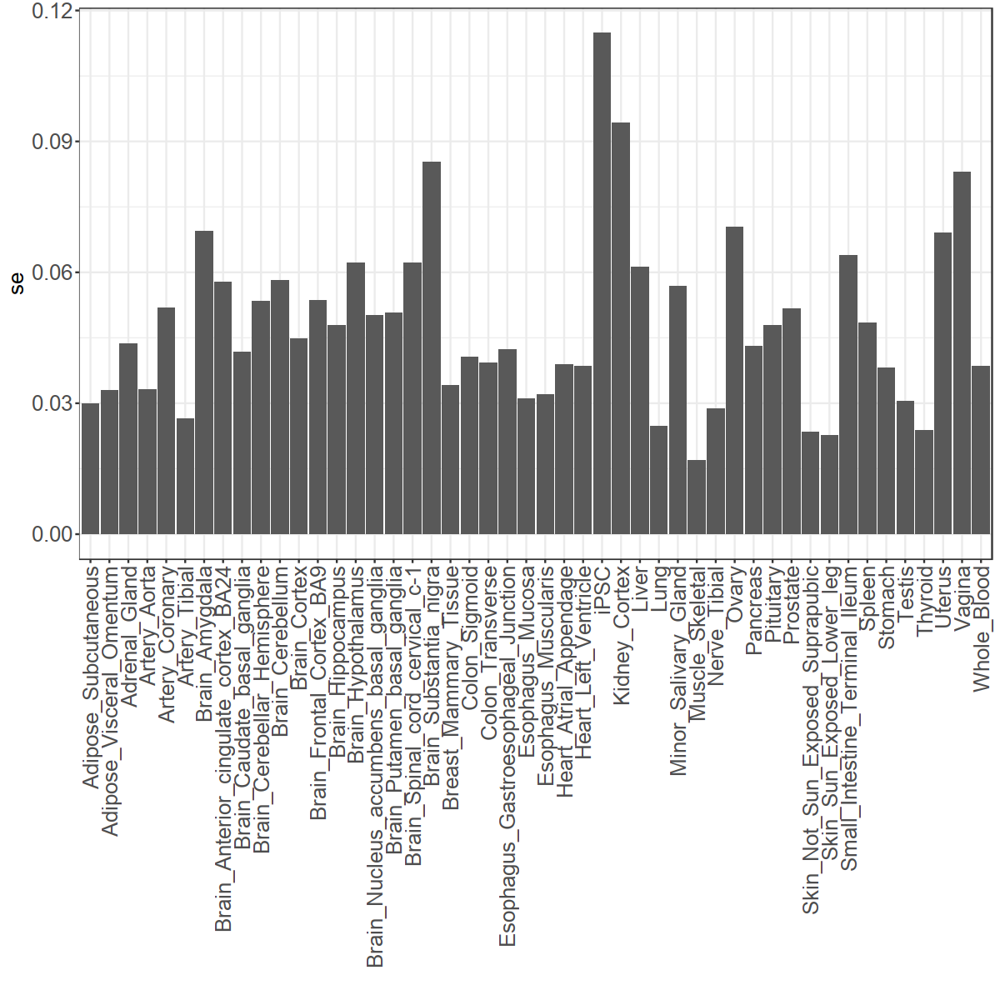

In [233]:
psize(w = 10, h = 10)
ggplot(lead_stats %>% filter(gene_variant == "ENSG00000009830 VAR_14_77316478_A_G"), aes(x = tissue, y = se)) + 
    geom_bar(stat = "identity") + 
    theme_bw2  + 
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5)) + 
    xlab("")


`geom_smooth()` using formula = 'y ~ x'


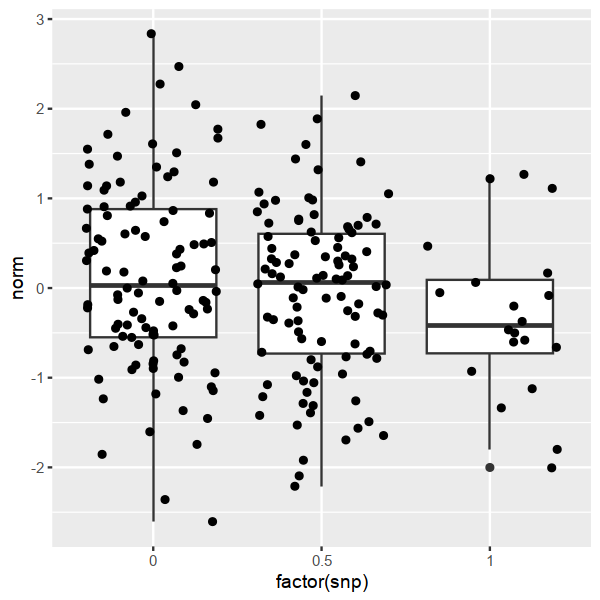

In [222]:
gtdata = add_rownames(fread("/projects/CARDIPS/analysis/epigenome_resource/eqtls/iPSC/step_1/genotype/by_element/gt_data.ENSG00000009830.13.txt", data.table = F))
exdata = fread("/projects/CARDIPS/analysis/epigenome_resource/eqtls/iPSC/step_1/phenotype/by_element/ENSG00000009830.13.txt", data.table = F)
colnames(exdata)[1] = c("phenotype_id")
gtdata = data.frame(t(gtdata["VAR_14_77316478_A_G",]))
colnames(gtdata) = c("snp")
gtdata$genotype_id = rownames(gtdata)
meta = fread("eqtls/iPSC/input/full.metadata_sample.txt", data.table = F)
meta = merge(exdata, merge(meta %>% select(phenotype_id, genotype_id), gtdata))

psize(w = 5, h = 5)
ggplot(meta, aes(x = factor(snp), y = norm)) + geom_boxplot() + geom_jitter() + geom_smooth(method = "lm")

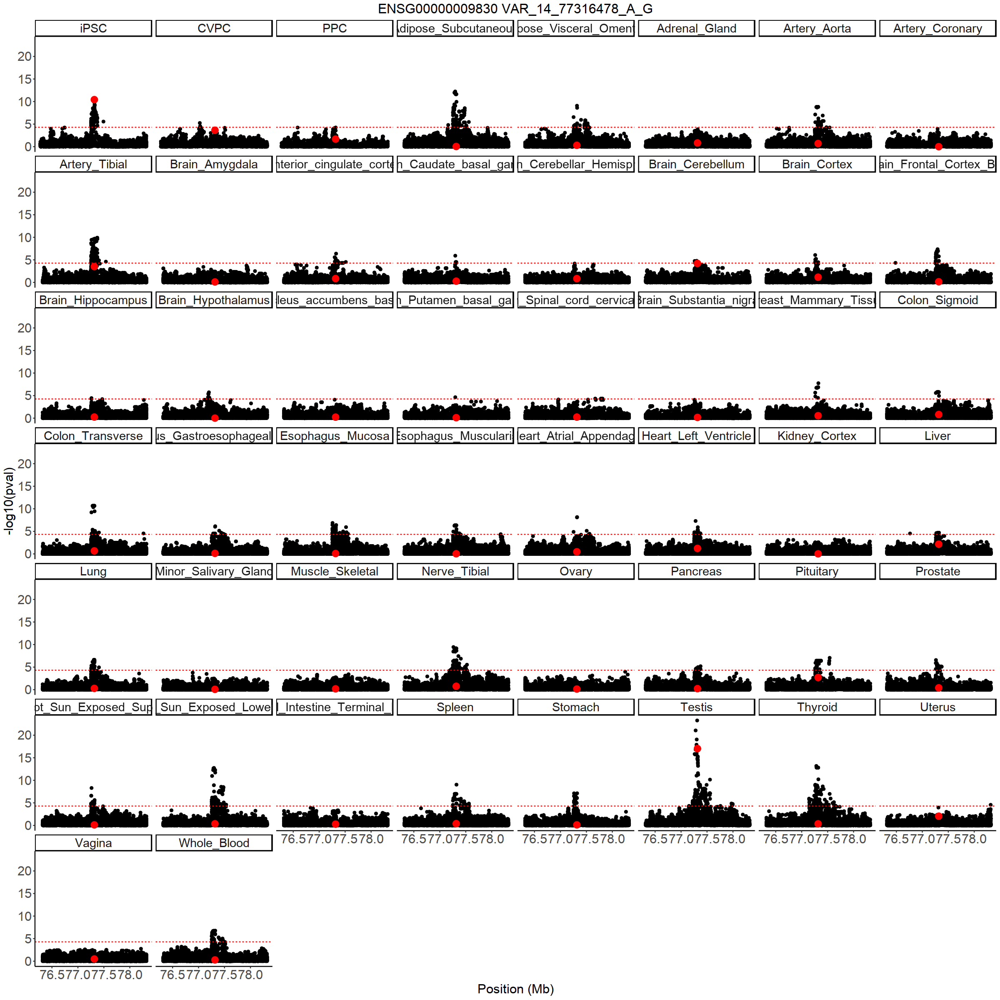

In [180]:
psize(w = 20, h = 20)
suppressMessages(plot_manhattan("ENSG00000009830 VAR_14_77316478_A_G", tmp))

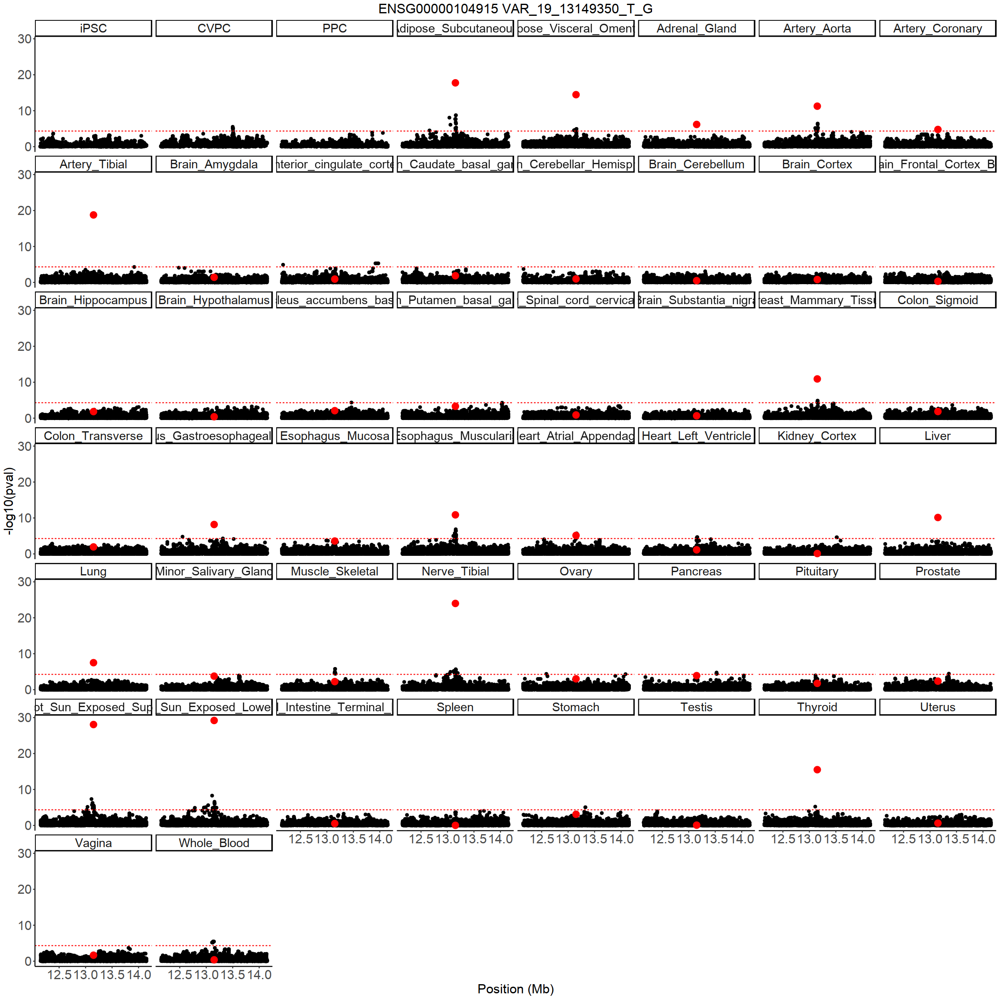

In [99]:
psize(w = 20, h = 20)
p

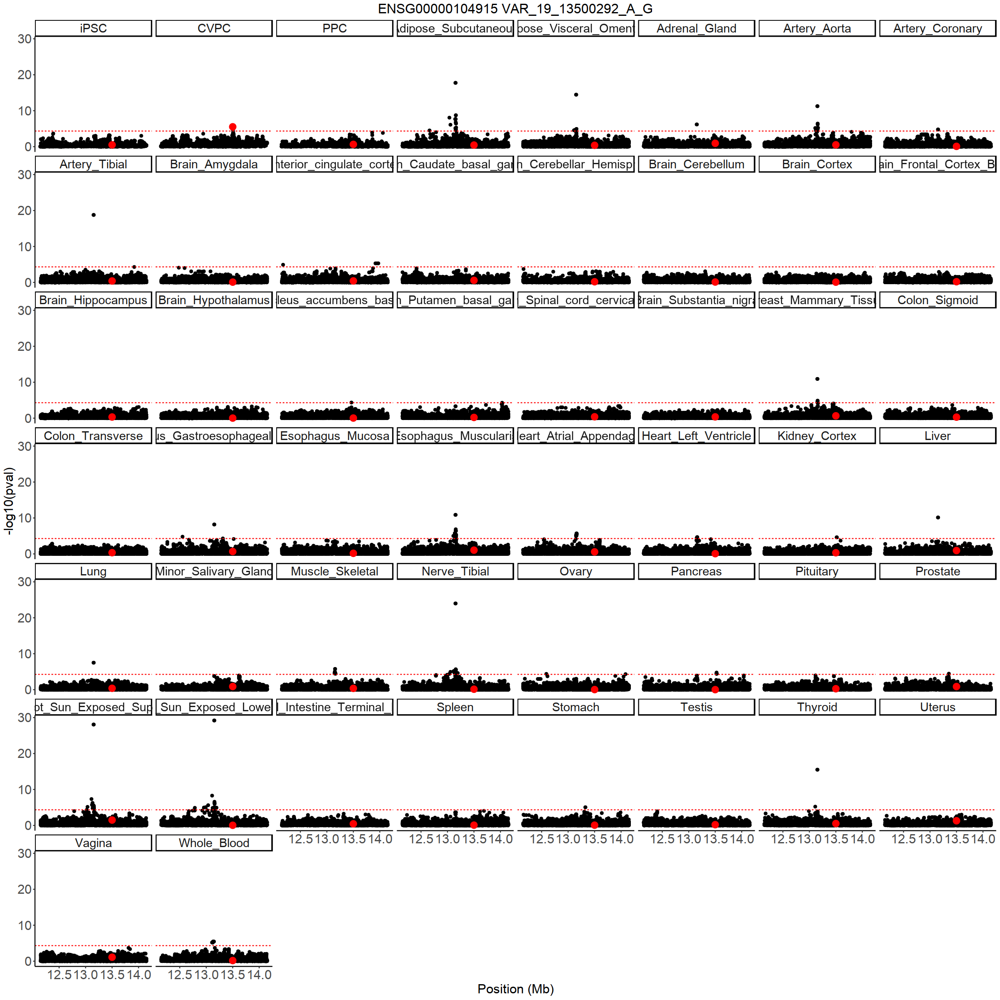

In [94]:
psize(w = 20, h = 20)
p

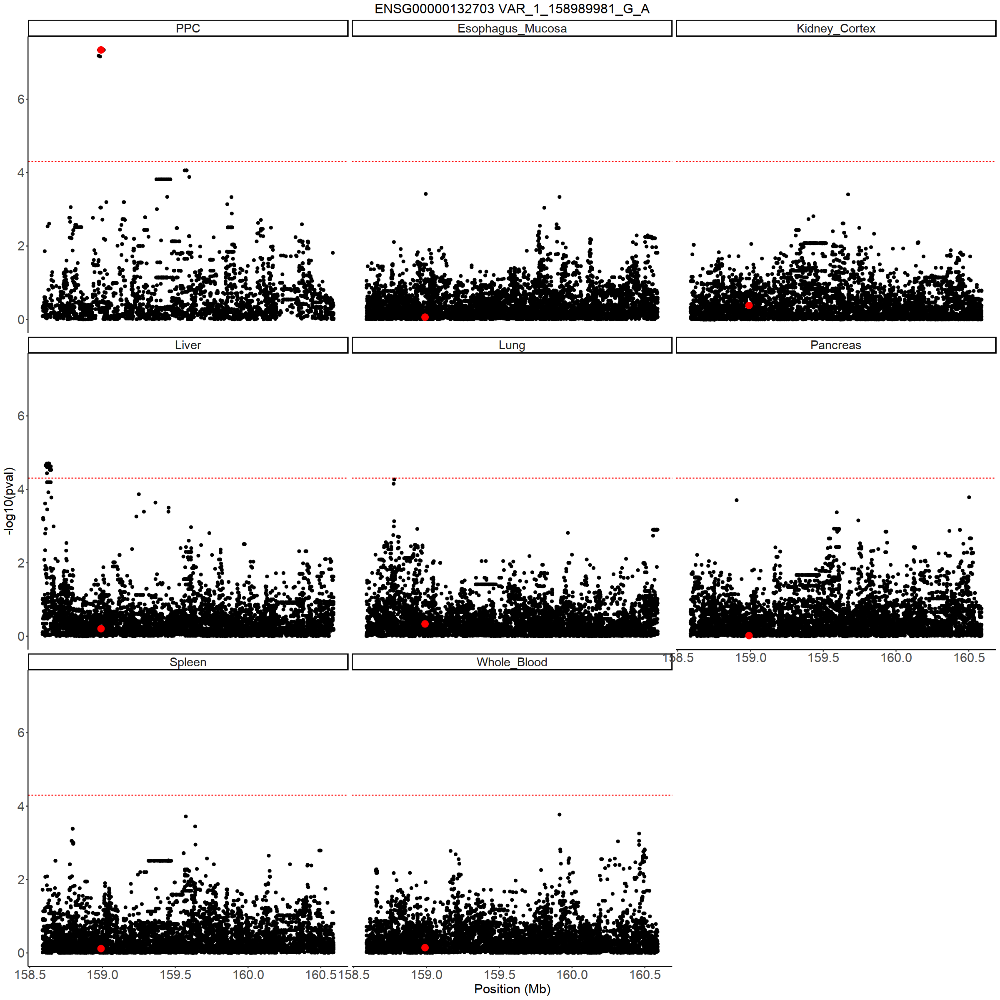

In [66]:
psize(w = 20, h = 20)
p

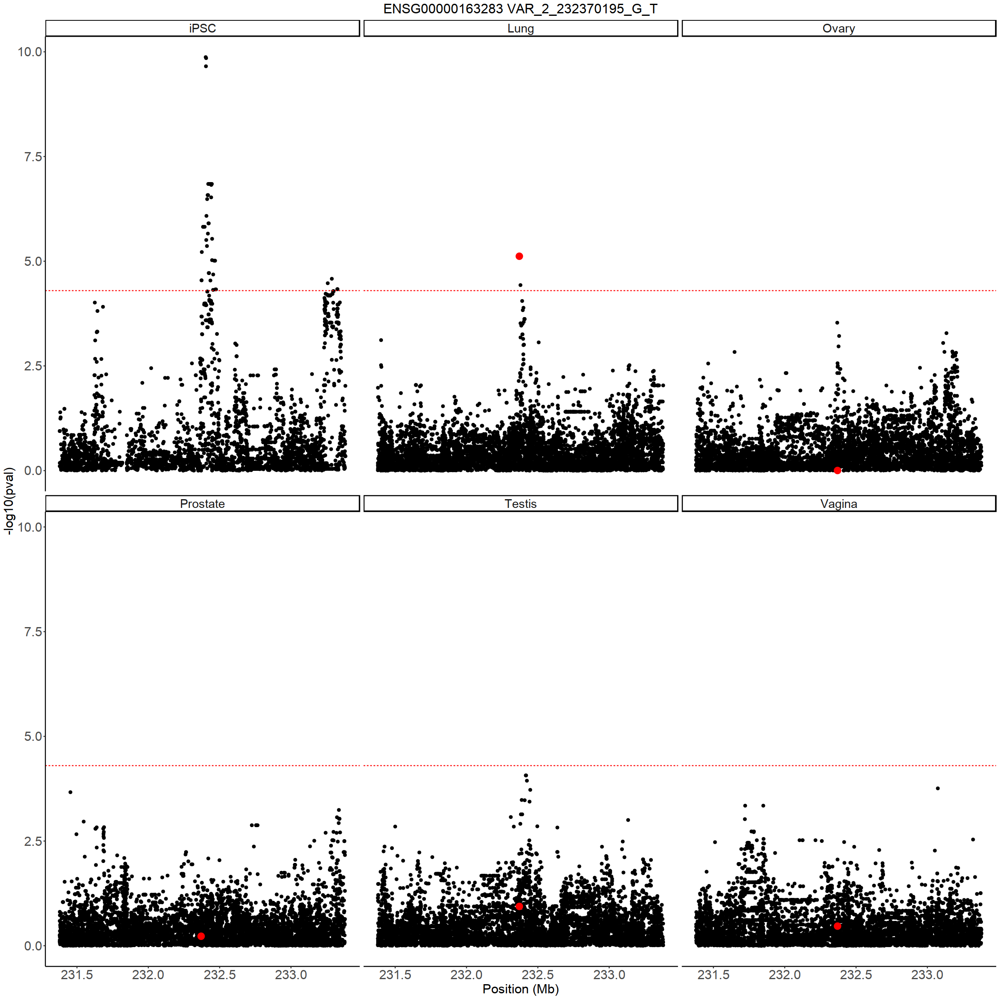

In [62]:
psize(w = 20, h = 20)
p

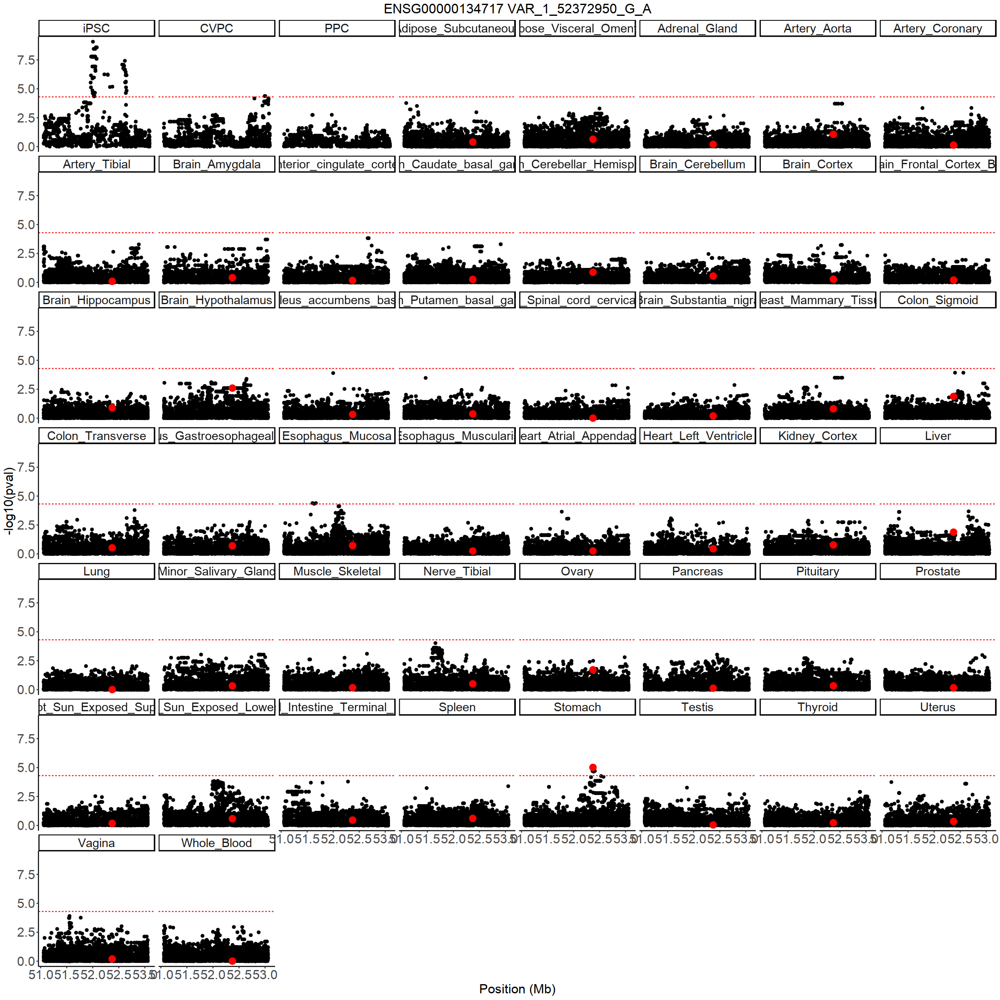

In [57]:
psize(w = 20, h = 20)
p

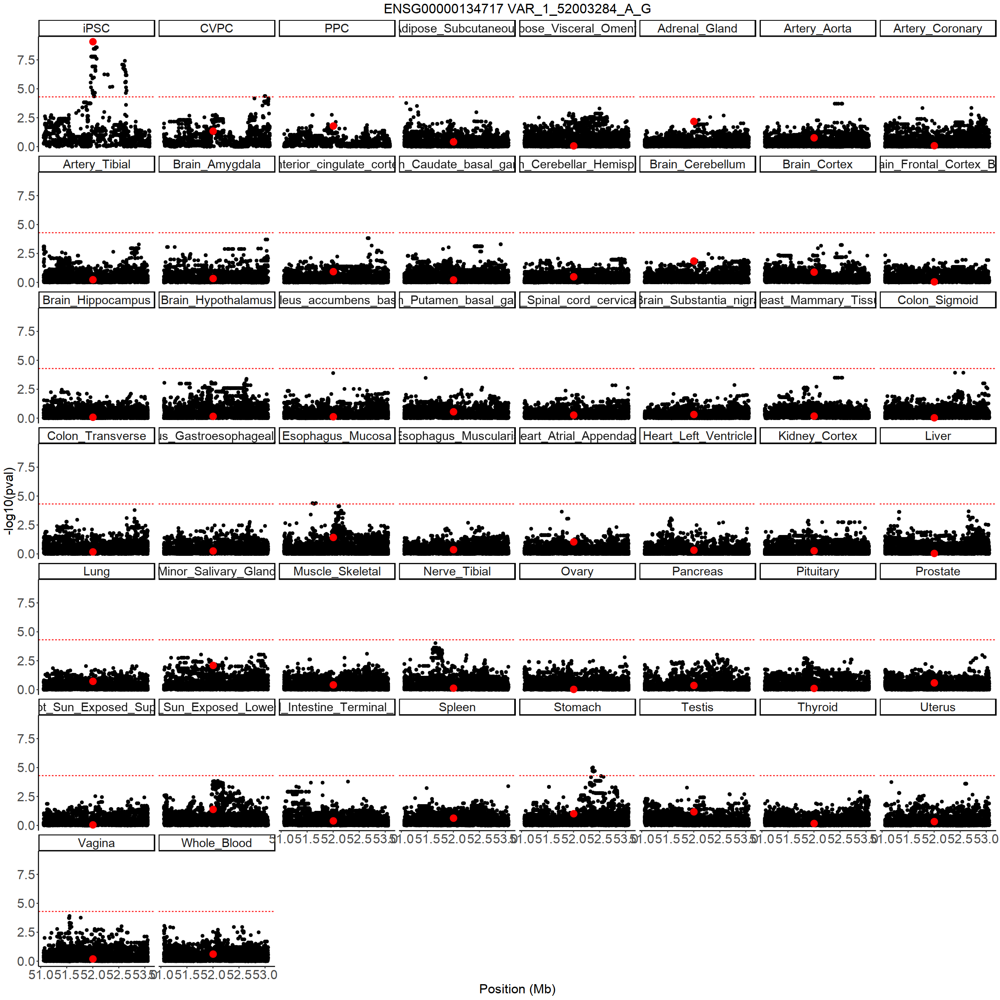

In [52]:
psize(w = 20, h = 20)
p

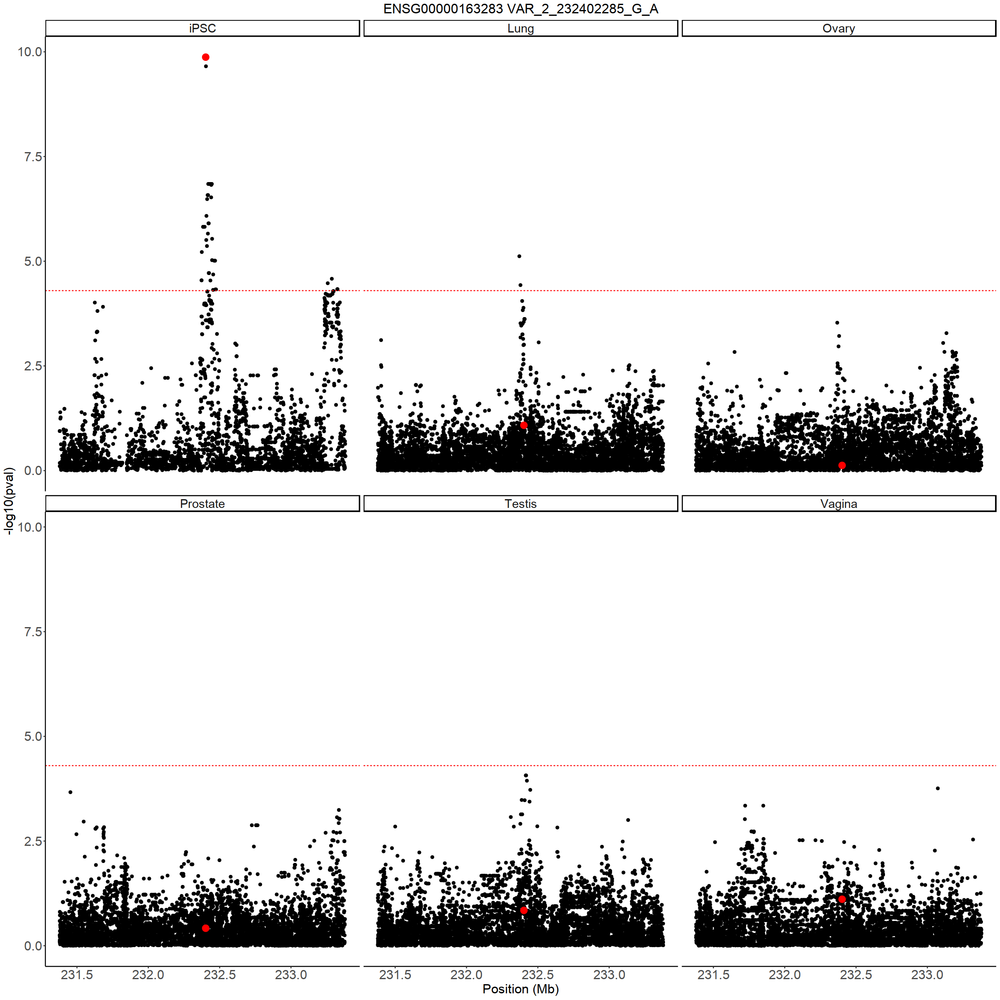

In [36]:
psize(w = 20, h = 20)
p

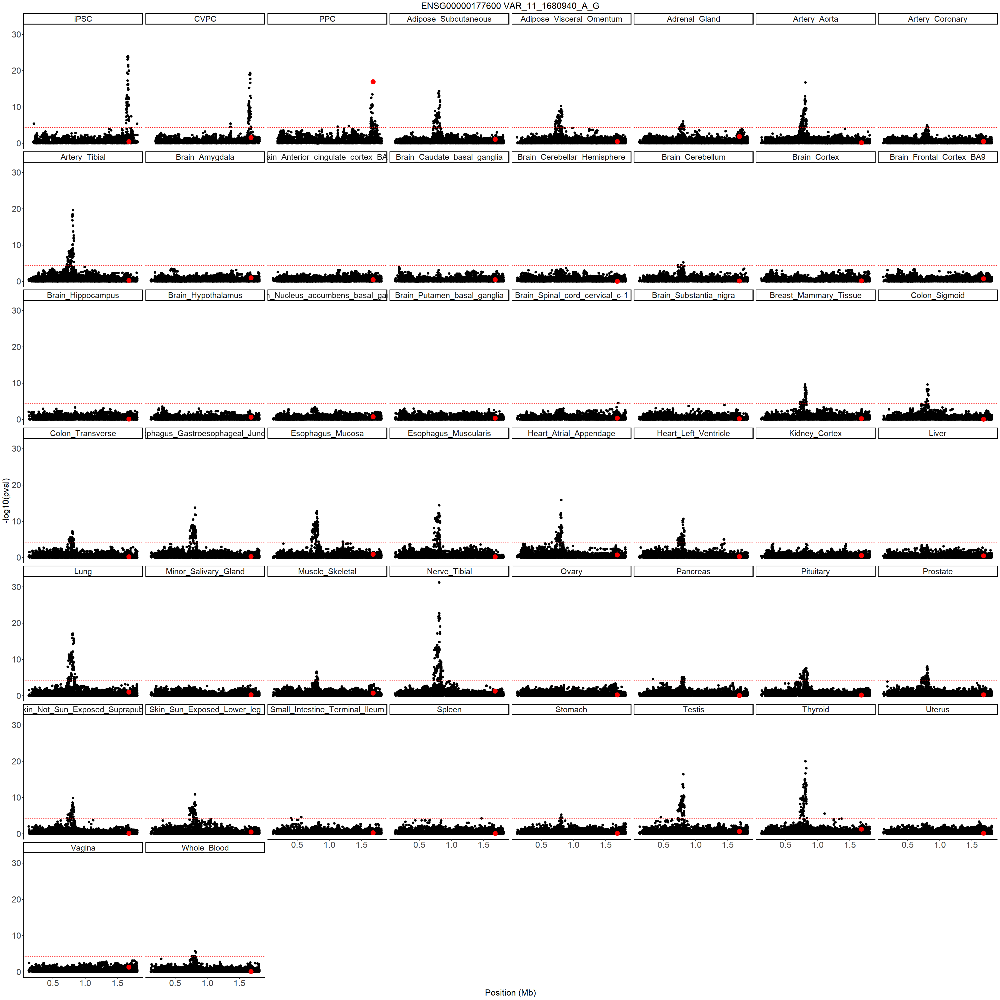

In [394]:
psize(w = 30, h = 30)
p

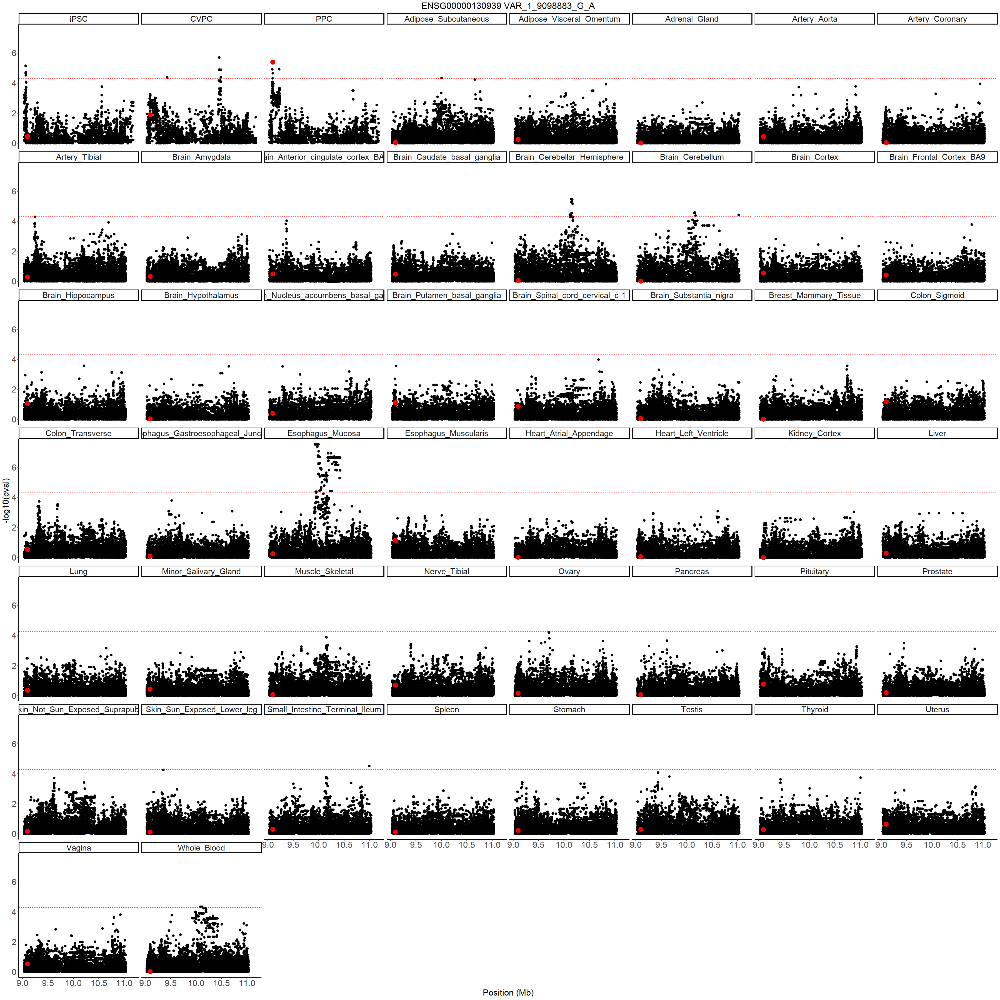

In [375]:
psize(w = 30, h = 30)
p

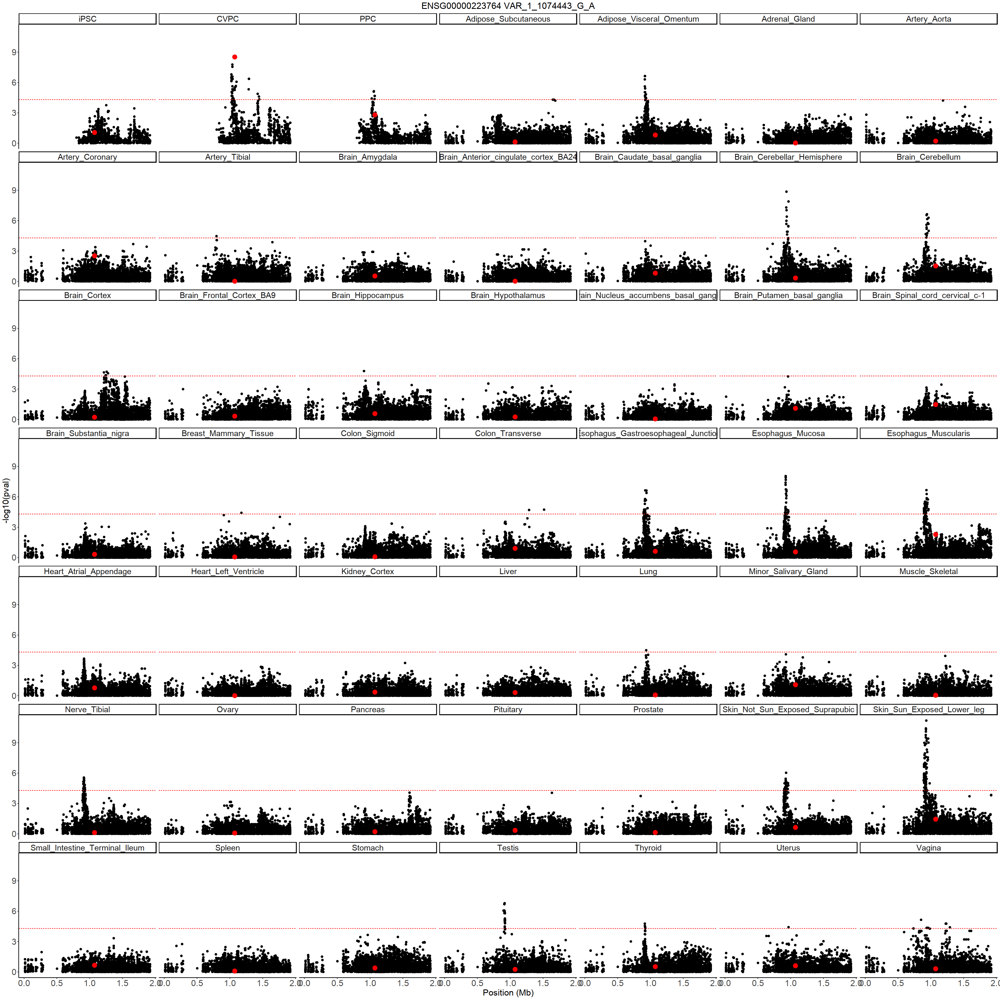

In [372]:
psize(w = 30, h = 30)
p

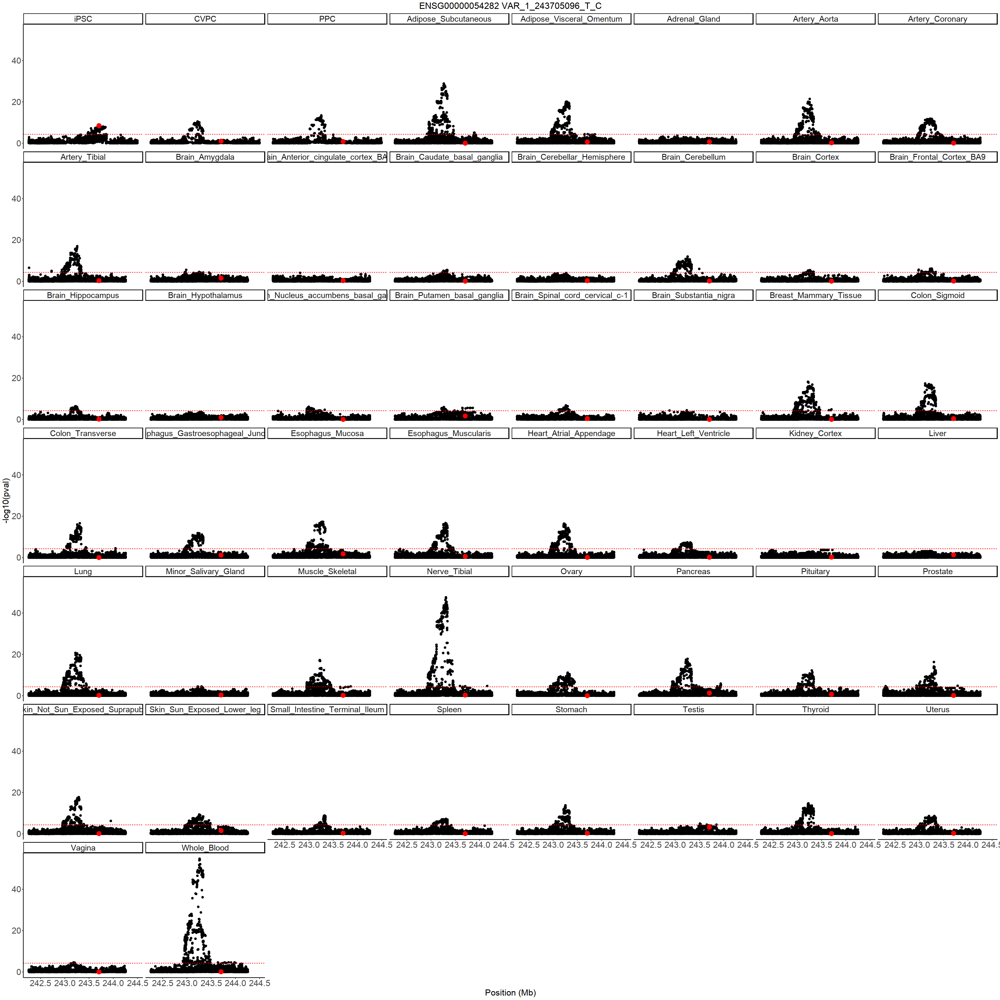

In [209]:
psize(w = 30, h = 30)
p

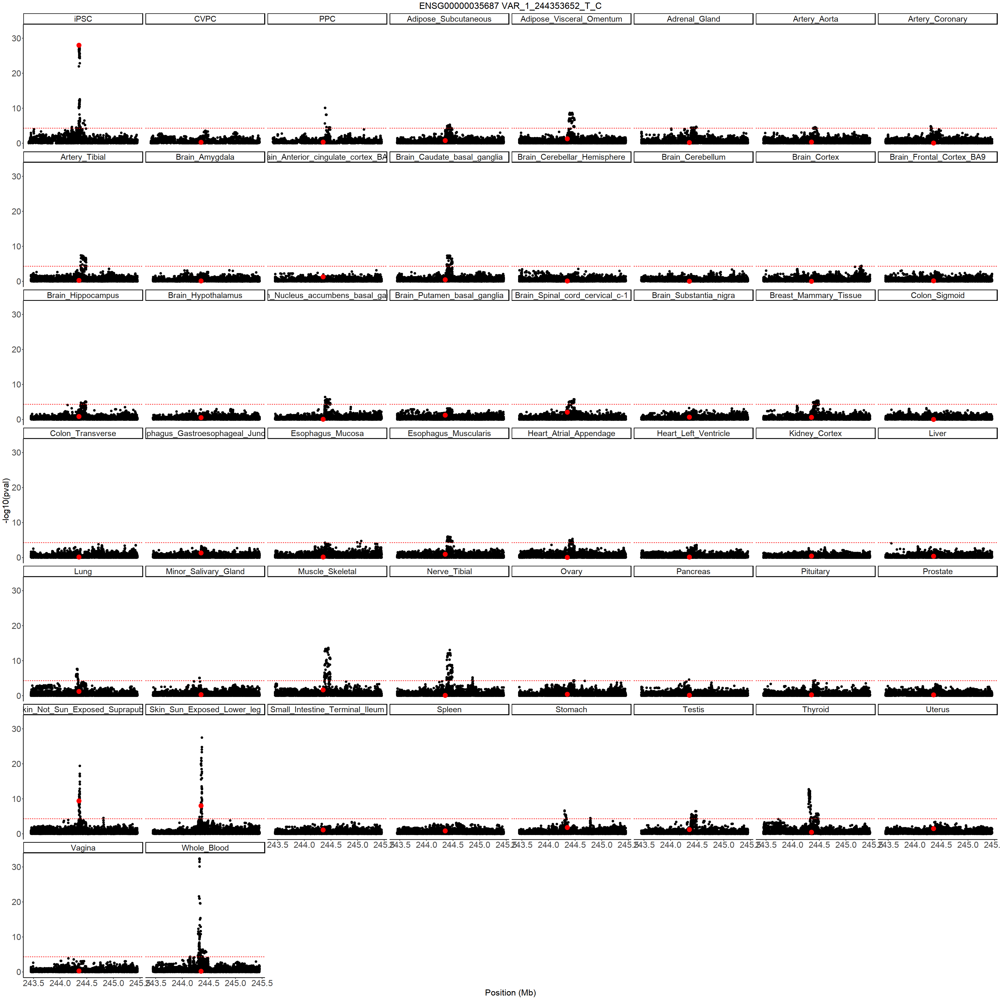

In [205]:
psize(w = 30, h = 30)
p

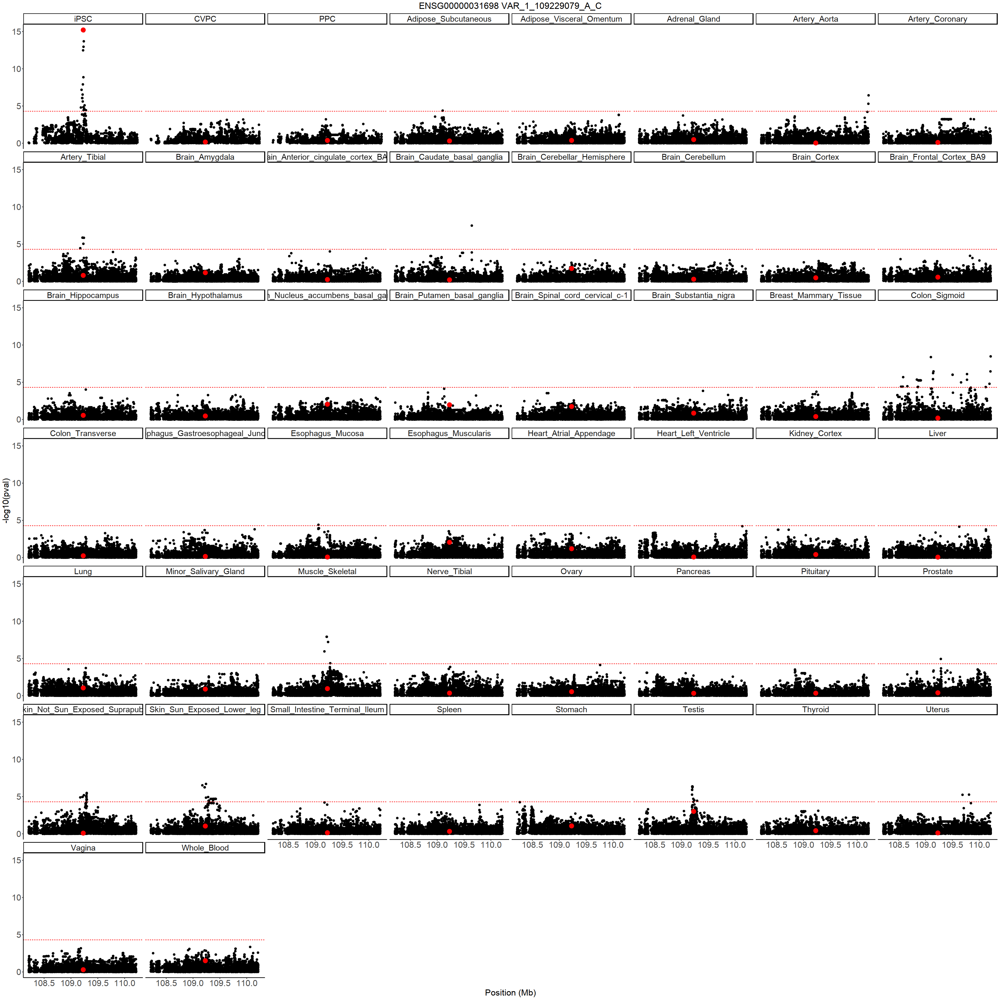

In [203]:
psize(w = 30, h = 30)
p